In [1]:
import torch
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np

import sys
import os
sys.path.append(os.path.abspath(os.path.join("..", "src")))
from prepare_dataset import get_dataloaders
from models import FSRCA
from utils import train_model, save_results, load_results, evaluate_model_on_sets
%load_ext autoreload
%autoreload 2

In [2]:
# variable definitions
factor = 2
device = torch.device("cuda")
model_name = "fsrca"
criterion = torch.nn.L1Loss()
MODEL_CLASS = FSRCA
train_epochs, ft_epochs = 1000, 1000
train_lr, ft_lr = 1e-4, 1e-4

### Train

In [3]:
model = MODEL_CLASS(upsample_factor=factor)
train_loader, val_loader = get_dataloaders(factor, n_workers_train=0, n_workers_val=0)
print(summary(model, input_size=(1, 1, 33, 33), device=device.type))

Layer (type:depth-idx)                                  Output Shape              Param #
FSRCA                                                   [1, 1, 66, 66]            --
├─Sequential: 1-1                                       [1, 56, 33, 33]           --
│    └─Conv2d: 2-1                                      [1, 56, 33, 33]           1,456
│    └─PReLU: 2-2                                       [1, 56, 33, 33]           56
├─Sequential: 1-2                                       [1, 12, 33, 33]           --
│    └─Conv2d: 2-3                                      [1, 12, 33, 33]           684
│    └─PReLU: 2-4                                       [1, 12, 33, 33]           12
├─RIR: 1-3                                              [1, 12, 33, 33]           --
│    └─Sequential: 2-5                                  [1, 12, 33, 33]           --
│    │    └─RCAB: 3-1                                   [1, 12, 33, 33]           2,653
│    │    └─RCAB: 3-2                                

In [4]:
train_loss, val_loss, psnr_list = train_model(model, train_loader, val_loader, factor, num_epochs=train_epochs, lr=train_lr, criterion=criterion)
save_results(model, train_loss, val_loss, psnr_list, model_name, factor)

Epoch 1/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.05it/s]


[Epoch 1] Train Loss: 0.098126
[Epoch 1] Validation Loss: 0.047653, PSNR: 24.10


Epoch 2/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 2] Train Loss: 0.041980
[Epoch 2] Validation Loss: 0.033078, PSNR: 27.40


Epoch 3/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 3] Train Loss: 0.031251
[Epoch 3] Validation Loss: 0.027500, PSNR: 29.10


Epoch 4/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 4] Train Loss: 0.026703
[Epoch 4] Validation Loss: 0.025484, PSNR: 29.87


Epoch 5/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 5] Train Loss: 0.024702
[Epoch 5] Validation Loss: 0.023972, PSNR: 30.42


Epoch 6/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 6] Train Loss: 0.023621
[Epoch 6] Validation Loss: 0.023446, PSNR: 30.65


Epoch 7/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 7] Train Loss: 0.022723
[Epoch 7] Validation Loss: 0.022297, PSNR: 31.05


Epoch 8/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 8] Train Loss: 0.022247
[Epoch 8] Validation Loss: 0.021691, PSNR: 31.28


Epoch 9/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 9] Train Loss: 0.021700
[Epoch 9] Validation Loss: 0.021937, PSNR: 31.23
No improvement for 1 epochs.


Epoch 10/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 10] Train Loss: 0.021314
[Epoch 10] Validation Loss: 0.021382, PSNR: 31.43


Epoch 11/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 11] Train Loss: 0.021104
[Epoch 11] Validation Loss: 0.021424, PSNR: 31.44
No improvement for 1 epochs.


Epoch 12/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 12] Train Loss: 0.020843
[Epoch 12] Validation Loss: 0.020673, PSNR: 31.70


Epoch 13/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 13] Train Loss: 0.020616
[Epoch 13] Validation Loss: 0.020454, PSNR: 31.79


Epoch 14/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 14] Train Loss: 0.020363
[Epoch 14] Validation Loss: 0.021269, PSNR: 31.54
No improvement for 1 epochs.


Epoch 15/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 15] Train Loss: 0.020173
[Epoch 15] Validation Loss: 0.020301, PSNR: 31.87


Epoch 16/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 16] Train Loss: 0.020014
[Epoch 16] Validation Loss: 0.020192, PSNR: 31.91


Epoch 17/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 17] Train Loss: 0.019925
[Epoch 17] Validation Loss: 0.020054, PSNR: 31.97


Epoch 18/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 18] Train Loss: 0.019773
[Epoch 18] Validation Loss: 0.020334, PSNR: 31.88
No improvement for 1 epochs.


Epoch 19/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 19] Train Loss: 0.019606
[Epoch 19] Validation Loss: 0.020236, PSNR: 31.93
No improvement for 2 epochs.


Epoch 20/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 20] Train Loss: 0.019603
[Epoch 20] Validation Loss: 0.019955, PSNR: 32.03


Epoch 21/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 21] Train Loss: 0.019402
[Epoch 21] Validation Loss: 0.019805, PSNR: 32.08


Epoch 22/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 22] Train Loss: 0.019379
[Epoch 22] Validation Loss: 0.019771, PSNR: 32.10


Epoch 23/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 23] Train Loss: 0.019311
[Epoch 23] Validation Loss: 0.019841, PSNR: 32.08
No improvement for 1 epochs.


Epoch 24/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 24] Train Loss: 0.019195
[Epoch 24] Validation Loss: 0.019417, PSNR: 32.23


Epoch 25/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.12it/s]


[Epoch 25] Train Loss: 0.019097
[Epoch 25] Validation Loss: 0.019343, PSNR: 32.26


Epoch 26/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.11it/s]


[Epoch 26] Train Loss: 0.019035
[Epoch 26] Validation Loss: 0.019414, PSNR: 32.24
No improvement for 1 epochs.


Epoch 27/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 27] Train Loss: 0.019035
[Epoch 27] Validation Loss: 0.019704, PSNR: 32.14
No improvement for 2 epochs.


Epoch 28/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.07it/s]


[Epoch 28] Train Loss: 0.018974
[Epoch 28] Validation Loss: 0.019438, PSNR: 32.24
No improvement for 3 epochs.


Epoch 29/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 29] Train Loss: 0.018885
[Epoch 29] Validation Loss: 0.019937, PSNR: 32.07
No improvement for 4 epochs.


Epoch 30/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 30] Train Loss: 0.018846
[Epoch 30] Validation Loss: 0.019958, PSNR: 32.07
No improvement for 5 epochs.


Epoch 31/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 31] Train Loss: 0.018863
[Epoch 31] Validation Loss: 0.019244, PSNR: 32.32


Epoch 32/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 32] Train Loss: 0.018740
[Epoch 32] Validation Loss: 0.019438, PSNR: 32.25
No improvement for 1 epochs.


Epoch 33/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 33] Train Loss: 0.018724
[Epoch 33] Validation Loss: 0.019691, PSNR: 32.16
No improvement for 2 epochs.


Epoch 34/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 34] Train Loss: 0.018710
[Epoch 34] Validation Loss: 0.019403, PSNR: 32.27
No improvement for 3 epochs.


Epoch 35/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 35] Train Loss: 0.018683
[Epoch 35] Validation Loss: 0.019135, PSNR: 32.36


Epoch 36/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 36] Train Loss: 0.018594
[Epoch 36] Validation Loss: 0.018973, PSNR: 32.42


Epoch 37/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 37] Train Loss: 0.018595
[Epoch 37] Validation Loss: 0.019541, PSNR: 32.22
No improvement for 1 epochs.


Epoch 38/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 38] Train Loss: 0.018511
[Epoch 38] Validation Loss: 0.019074, PSNR: 32.39
No improvement for 2 epochs.


Epoch 39/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 39] Train Loss: 0.018538
[Epoch 39] Validation Loss: 0.019194, PSNR: 32.35
No improvement for 3 epochs.


Epoch 40/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 40] Train Loss: 0.018560
[Epoch 40] Validation Loss: 0.019085, PSNR: 32.39
No improvement for 4 epochs.


Epoch 41/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 41] Train Loss: 0.018449
[Epoch 41] Validation Loss: 0.019029, PSNR: 32.41
No improvement for 5 epochs.


Epoch 42/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 42] Train Loss: 0.018472
[Epoch 42] Validation Loss: 0.018821, PSNR: 32.48


Epoch 43/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 43] Train Loss: 0.018403
[Epoch 43] Validation Loss: 0.019305, PSNR: 32.32
No improvement for 1 epochs.


Epoch 44/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 44] Train Loss: 0.018473
[Epoch 44] Validation Loss: 0.019446, PSNR: 32.27
No improvement for 2 epochs.


Epoch 45/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 45] Train Loss: 0.018339
[Epoch 45] Validation Loss: 0.019042, PSNR: 32.41
No improvement for 3 epochs.


Epoch 46/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 46] Train Loss: 0.018352
[Epoch 46] Validation Loss: 0.018894, PSNR: 32.46
No improvement for 4 epochs.


Epoch 47/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 47] Train Loss: 0.018350
[Epoch 47] Validation Loss: 0.018877, PSNR: 32.47
No improvement for 5 epochs.


Epoch 48/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 48] Train Loss: 0.018305
[Epoch 48] Validation Loss: 0.018966, PSNR: 32.44
No improvement for 6 epochs.


Epoch 49/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 49] Train Loss: 0.017995
[Epoch 49] Validation Loss: 0.018719, PSNR: 32.53


Epoch 50/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 50] Train Loss: 0.017977
[Epoch 50] Validation Loss: 0.018709, PSNR: 32.53


Epoch 51/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 51] Train Loss: 0.017954
[Epoch 51] Validation Loss: 0.018701, PSNR: 32.53


Epoch 52/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 52] Train Loss: 0.017947
[Epoch 52] Validation Loss: 0.018693, PSNR: 32.54


Epoch 53/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 53] Train Loss: 0.017929
[Epoch 53] Validation Loss: 0.018683, PSNR: 32.54


Epoch 54/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 54] Train Loss: 0.017904
[Epoch 54] Validation Loss: 0.018675, PSNR: 32.55


Epoch 55/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 55] Train Loss: 0.017904
[Epoch 55] Validation Loss: 0.018666, PSNR: 32.55


Epoch 56/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 56] Train Loss: 0.017896
[Epoch 56] Validation Loss: 0.018658, PSNR: 32.55


Epoch 57/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 57] Train Loss: 0.017878
[Epoch 57] Validation Loss: 0.018654, PSNR: 32.55


Epoch 58/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 58] Train Loss: 0.017871
[Epoch 58] Validation Loss: 0.018652, PSNR: 32.56


Epoch 59/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 59] Train Loss: 0.017862
[Epoch 59] Validation Loss: 0.018632, PSNR: 32.56


Epoch 60/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 60] Train Loss: 0.017869
[Epoch 60] Validation Loss: 0.018624, PSNR: 32.57


Epoch 61/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 61] Train Loss: 0.017879
[Epoch 61] Validation Loss: 0.018729, PSNR: 32.53
No improvement for 1 epochs.


Epoch 62/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 62] Train Loss: 0.017950
[Epoch 62] Validation Loss: 0.018610, PSNR: 32.58


Epoch 63/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 63] Train Loss: 0.017889
[Epoch 63] Validation Loss: 0.018634, PSNR: 32.57
No improvement for 1 epochs.


Epoch 64/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 64] Train Loss: 0.017900
[Epoch 64] Validation Loss: 0.018618, PSNR: 32.57
No improvement for 2 epochs.


Epoch 65/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 65] Train Loss: 0.017866
[Epoch 65] Validation Loss: 0.018667, PSNR: 32.56
No improvement for 3 epochs.


Epoch 66/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 66] Train Loss: 0.017906
[Epoch 66] Validation Loss: 0.018764, PSNR: 32.53
No improvement for 4 epochs.


Epoch 67/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 67] Train Loss: 0.017871
[Epoch 67] Validation Loss: 0.019063, PSNR: 32.42
No improvement for 5 epochs.


Epoch 68/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 68] Train Loss: 0.017876
[Epoch 68] Validation Loss: 0.018659, PSNR: 32.57
No improvement for 6 epochs.


Epoch 69/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 69] Train Loss: 0.017744
[Epoch 69] Validation Loss: 0.018553, PSNR: 32.60


Epoch 70/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 70] Train Loss: 0.017727
[Epoch 70] Validation Loss: 0.018549, PSNR: 32.60


Epoch 71/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 71] Train Loss: 0.017730
[Epoch 71] Validation Loss: 0.018545, PSNR: 32.60


Epoch 72/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 72] Train Loss: 0.017730
[Epoch 72] Validation Loss: 0.018541, PSNR: 32.61


Epoch 73/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 73] Train Loss: 0.017722
[Epoch 73] Validation Loss: 0.018535, PSNR: 32.61


Epoch 74/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 74] Train Loss: 0.017708
[Epoch 74] Validation Loss: 0.018531, PSNR: 32.61


Epoch 75/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.11it/s]


[Epoch 75] Train Loss: 0.017706
[Epoch 75] Validation Loss: 0.018527, PSNR: 32.61


Epoch 76/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 76] Train Loss: 0.017697
[Epoch 76] Validation Loss: 0.018521, PSNR: 32.62


Epoch 77/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 77] Train Loss: 0.017699
[Epoch 77] Validation Loss: 0.018520, PSNR: 32.62


Epoch 78/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 78] Train Loss: 0.017685
[Epoch 78] Validation Loss: 0.018513, PSNR: 32.62


Epoch 79/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 79] Train Loss: 0.017674
[Epoch 79] Validation Loss: 0.018515, PSNR: 32.62
No improvement for 1 epochs.


Epoch 80/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 80] Train Loss: 0.017665
[Epoch 80] Validation Loss: 0.018500, PSNR: 32.63


Epoch 81/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 81] Train Loss: 0.017672
[Epoch 81] Validation Loss: 0.018504, PSNR: 32.63
No improvement for 1 epochs.


Epoch 82/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 82] Train Loss: 0.017661
[Epoch 82] Validation Loss: 0.018491, PSNR: 32.63


Epoch 83/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 83] Train Loss: 0.017648
[Epoch 83] Validation Loss: 0.018486, PSNR: 32.63


Epoch 84/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 84] Train Loss: 0.017662
[Epoch 84] Validation Loss: 0.018512, PSNR: 32.63
No improvement for 1 epochs.


Epoch 85/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 85] Train Loss: 0.017665
[Epoch 85] Validation Loss: 0.018493, PSNR: 32.63
No improvement for 2 epochs.


Epoch 86/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 86] Train Loss: 0.017650
[Epoch 86] Validation Loss: 0.018488, PSNR: 32.64
No improvement for 3 epochs.


Epoch 87/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 87] Train Loss: 0.017655
[Epoch 87] Validation Loss: 0.018472, PSNR: 32.64


Epoch 88/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 88] Train Loss: 0.017659
[Epoch 88] Validation Loss: 0.018457, PSNR: 32.65


Epoch 89/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 89] Train Loss: 0.017628
[Epoch 89] Validation Loss: 0.018461, PSNR: 32.65
No improvement for 1 epochs.


Epoch 90/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 90] Train Loss: 0.017667
[Epoch 90] Validation Loss: 0.018483, PSNR: 32.64
No improvement for 2 epochs.


Epoch 91/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 91] Train Loss: 0.017642
[Epoch 91] Validation Loss: 0.018465, PSNR: 32.65
No improvement for 3 epochs.


Epoch 92/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 92] Train Loss: 0.017611
[Epoch 92] Validation Loss: 0.018439, PSNR: 32.66


Epoch 93/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 93] Train Loss: 0.017592
[Epoch 93] Validation Loss: 0.018445, PSNR: 32.66
No improvement for 1 epochs.


Epoch 94/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 94] Train Loss: 0.017580
[Epoch 94] Validation Loss: 0.018434, PSNR: 32.66


Epoch 95/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 95] Train Loss: 0.017568
[Epoch 95] Validation Loss: 0.018441, PSNR: 32.66
No improvement for 1 epochs.


Epoch 96/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 96] Train Loss: 0.017583
[Epoch 96] Validation Loss: 0.018495, PSNR: 32.64
No improvement for 2 epochs.


Epoch 97/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 97] Train Loss: 0.017588
[Epoch 97] Validation Loss: 0.018428, PSNR: 32.67


Epoch 98/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 98] Train Loss: 0.017549
[Epoch 98] Validation Loss: 0.018412, PSNR: 32.67


Epoch 99/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 99] Train Loss: 0.017577
[Epoch 99] Validation Loss: 0.018398, PSNR: 32.68


Epoch 100/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 100] Train Loss: 0.017532
[Epoch 100] Validation Loss: 0.018403, PSNR: 32.68
No improvement for 1 epochs.


Epoch 101/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 101] Train Loss: 0.017554
[Epoch 101] Validation Loss: 0.018397, PSNR: 32.68


Epoch 102/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 102] Train Loss: 0.017532
[Epoch 102] Validation Loss: 0.018402, PSNR: 32.68
No improvement for 1 epochs.


Epoch 103/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 103] Train Loss: 0.017538
[Epoch 103] Validation Loss: 0.018385, PSNR: 32.69


Epoch 104/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 104] Train Loss: 0.017504
[Epoch 104] Validation Loss: 0.018447, PSNR: 32.67
No improvement for 1 epochs.


Epoch 105/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 105] Train Loss: 0.017516
[Epoch 105] Validation Loss: 0.018386, PSNR: 32.69
No improvement for 2 epochs.


Epoch 106/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 106] Train Loss: 0.017522
[Epoch 106] Validation Loss: 0.018364, PSNR: 32.70


Epoch 107/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 107] Train Loss: 0.017470
[Epoch 107] Validation Loss: 0.018393, PSNR: 32.69
No improvement for 1 epochs.


Epoch 108/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 108] Train Loss: 0.017474
[Epoch 108] Validation Loss: 0.018353, PSNR: 32.71


Epoch 109/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 109] Train Loss: 0.017486
[Epoch 109] Validation Loss: 0.018370, PSNR: 32.70
No improvement for 1 epochs.


Epoch 110/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 110] Train Loss: 0.017455
[Epoch 110] Validation Loss: 0.018368, PSNR: 32.70
No improvement for 2 epochs.


Epoch 111/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 111] Train Loss: 0.017478
[Epoch 111] Validation Loss: 0.018341, PSNR: 32.71


Epoch 112/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 112] Train Loss: 0.017438
[Epoch 112] Validation Loss: 0.018345, PSNR: 32.71
No improvement for 1 epochs.


Epoch 113/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 113] Train Loss: 0.017432
[Epoch 113] Validation Loss: 0.018355, PSNR: 32.71
No improvement for 2 epochs.


Epoch 114/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 114] Train Loss: 0.017437
[Epoch 114] Validation Loss: 0.018375, PSNR: 32.70
No improvement for 3 epochs.


Epoch 115/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 115] Train Loss: 0.017423
[Epoch 115] Validation Loss: 0.018316, PSNR: 32.73


Epoch 116/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 116] Train Loss: 0.017452
[Epoch 116] Validation Loss: 0.018308, PSNR: 32.73


Epoch 117/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 117] Train Loss: 0.017414
[Epoch 117] Validation Loss: 0.018336, PSNR: 32.72
No improvement for 1 epochs.


Epoch 118/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 118] Train Loss: 0.017459
[Epoch 118] Validation Loss: 0.018297, PSNR: 32.74


Epoch 119/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 119] Train Loss: 0.017381
[Epoch 119] Validation Loss: 0.018325, PSNR: 32.73
No improvement for 1 epochs.


Epoch 120/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 120] Train Loss: 0.017391
[Epoch 120] Validation Loss: 0.018294, PSNR: 32.74


Epoch 121/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 121] Train Loss: 0.017391
[Epoch 121] Validation Loss: 0.018454, PSNR: 32.68
No improvement for 1 epochs.


Epoch 122/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 122] Train Loss: 0.017384
[Epoch 122] Validation Loss: 0.018277, PSNR: 32.75


Epoch 123/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 123] Train Loss: 0.017379
[Epoch 123] Validation Loss: 0.018288, PSNR: 32.75
No improvement for 1 epochs.


Epoch 124/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 124] Train Loss: 0.017382
[Epoch 124] Validation Loss: 0.018315, PSNR: 32.74
No improvement for 2 epochs.


Epoch 125/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 125] Train Loss: 0.017353
[Epoch 125] Validation Loss: 0.018271, PSNR: 32.75


Epoch 126/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 126] Train Loss: 0.017344
[Epoch 126] Validation Loss: 0.018257, PSNR: 32.76


Epoch 127/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 127] Train Loss: 0.017380
[Epoch 127] Validation Loss: 0.018253, PSNR: 32.76


Epoch 128/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 128] Train Loss: 0.017321
[Epoch 128] Validation Loss: 0.018269, PSNR: 32.76
No improvement for 1 epochs.


Epoch 129/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 129] Train Loss: 0.017350
[Epoch 129] Validation Loss: 0.018244, PSNR: 32.77


Epoch 130/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 130] Train Loss: 0.017328
[Epoch 130] Validation Loss: 0.018259, PSNR: 32.76
No improvement for 1 epochs.


Epoch 131/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 131] Train Loss: 0.017316
[Epoch 131] Validation Loss: 0.018236, PSNR: 32.77


Epoch 132/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 132] Train Loss: 0.017314
[Epoch 132] Validation Loss: 0.018235, PSNR: 32.77


Epoch 133/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 133] Train Loss: 0.017285
[Epoch 133] Validation Loss: 0.018243, PSNR: 32.77
No improvement for 1 epochs.


Epoch 134/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 134] Train Loss: 0.017303
[Epoch 134] Validation Loss: 0.018252, PSNR: 32.77
No improvement for 2 epochs.


Epoch 135/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 135] Train Loss: 0.017307
[Epoch 135] Validation Loss: 0.018213, PSNR: 32.79


Epoch 136/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 136] Train Loss: 0.017293
[Epoch 136] Validation Loss: 0.018209, PSNR: 32.79


Epoch 137/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 137] Train Loss: 0.017288
[Epoch 137] Validation Loss: 0.018205, PSNR: 32.79


Epoch 138/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 138] Train Loss: 0.017255
[Epoch 138] Validation Loss: 0.018351, PSNR: 32.74
No improvement for 1 epochs.


Epoch 139/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 139] Train Loss: 0.017256
[Epoch 139] Validation Loss: 0.018192, PSNR: 32.80


Epoch 140/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 140] Train Loss: 0.017249
[Epoch 140] Validation Loss: 0.018206, PSNR: 32.79
No improvement for 1 epochs.


Epoch 141/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 141] Train Loss: 0.017252
[Epoch 141] Validation Loss: 0.018199, PSNR: 32.80
No improvement for 2 epochs.


Epoch 142/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 142] Train Loss: 0.017277
[Epoch 142] Validation Loss: 0.018193, PSNR: 32.80
No improvement for 3 epochs.


Epoch 143/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 143] Train Loss: 0.017216
[Epoch 143] Validation Loss: 0.018172, PSNR: 32.81


Epoch 144/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 144] Train Loss: 0.017214
[Epoch 144] Validation Loss: 0.018165, PSNR: 32.82


Epoch 145/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 145] Train Loss: 0.017229
[Epoch 145] Validation Loss: 0.018163, PSNR: 32.82


Epoch 146/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 146] Train Loss: 0.017199
[Epoch 146] Validation Loss: 0.018191, PSNR: 32.81
No improvement for 1 epochs.


Epoch 147/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 147] Train Loss: 0.017225
[Epoch 147] Validation Loss: 0.018163, PSNR: 32.82
No improvement for 2 epochs.


Epoch 148/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 148] Train Loss: 0.017196
[Epoch 148] Validation Loss: 0.018167, PSNR: 32.82
No improvement for 3 epochs.


Epoch 149/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 149] Train Loss: 0.017180
[Epoch 149] Validation Loss: 0.018165, PSNR: 32.82
No improvement for 4 epochs.


Epoch 150/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 150] Train Loss: 0.017191
[Epoch 150] Validation Loss: 0.018142, PSNR: 32.83


Epoch 151/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 151] Train Loss: 0.017204
[Epoch 151] Validation Loss: 0.018130, PSNR: 32.84


Epoch 152/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 152] Train Loss: 0.017145
[Epoch 152] Validation Loss: 0.018124, PSNR: 32.84


Epoch 153/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 153] Train Loss: 0.017155
[Epoch 153] Validation Loss: 0.018134, PSNR: 32.84
No improvement for 1 epochs.


Epoch 154/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 154] Train Loss: 0.017159
[Epoch 154] Validation Loss: 0.018114, PSNR: 32.84


Epoch 155/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 155] Train Loss: 0.017129
[Epoch 155] Validation Loss: 0.018126, PSNR: 32.84
No improvement for 1 epochs.


Epoch 156/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 156] Train Loss: 0.017131
[Epoch 156] Validation Loss: 0.018130, PSNR: 32.84
No improvement for 2 epochs.


Epoch 157/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 157] Train Loss: 0.017121
[Epoch 157] Validation Loss: 0.018102, PSNR: 32.85


Epoch 158/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 158] Train Loss: 0.017118
[Epoch 158] Validation Loss: 0.018100, PSNR: 32.86


Epoch 159/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 159] Train Loss: 0.017127
[Epoch 159] Validation Loss: 0.018123, PSNR: 32.85
No improvement for 1 epochs.


Epoch 160/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 160] Train Loss: 0.017098
[Epoch 160] Validation Loss: 0.018126, PSNR: 32.85
No improvement for 2 epochs.


Epoch 161/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 161] Train Loss: 0.017113
[Epoch 161] Validation Loss: 0.018084, PSNR: 32.87


Epoch 162/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 162] Train Loss: 0.017087
[Epoch 162] Validation Loss: 0.018090, PSNR: 32.86
No improvement for 1 epochs.


Epoch 163/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 163] Train Loss: 0.017077
[Epoch 163] Validation Loss: 0.018072, PSNR: 32.87


Epoch 164/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 164] Train Loss: 0.017068
[Epoch 164] Validation Loss: 0.018099, PSNR: 32.86
No improvement for 1 epochs.


Epoch 165/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 165] Train Loss: 0.017062
[Epoch 165] Validation Loss: 0.018086, PSNR: 32.87
No improvement for 2 epochs.


Epoch 166/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 166] Train Loss: 0.017075
[Epoch 166] Validation Loss: 0.018073, PSNR: 32.88
No improvement for 3 epochs.


Epoch 167/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.05it/s]


[Epoch 167] Train Loss: 0.017029
[Epoch 167] Validation Loss: 0.018051, PSNR: 32.89


Epoch 168/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 168] Train Loss: 0.017037
[Epoch 168] Validation Loss: 0.018079, PSNR: 32.88
No improvement for 1 epochs.


Epoch 169/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 169] Train Loss: 0.017037
[Epoch 169] Validation Loss: 0.018057, PSNR: 32.89
No improvement for 2 epochs.


Epoch 170/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 170] Train Loss: 0.017041
[Epoch 170] Validation Loss: 0.018051, PSNR: 32.89
No improvement for 3 epochs.


Epoch 171/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 171] Train Loss: 0.017060
[Epoch 171] Validation Loss: 0.018030, PSNR: 32.90


Epoch 172/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 172] Train Loss: 0.017007
[Epoch 172] Validation Loss: 0.018024, PSNR: 32.90


Epoch 173/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 173] Train Loss: 0.017005
[Epoch 173] Validation Loss: 0.018035, PSNR: 32.90
No improvement for 1 epochs.


Epoch 174/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 174] Train Loss: 0.017006
[Epoch 174] Validation Loss: 0.018012, PSNR: 32.91


Epoch 175/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 175] Train Loss: 0.017016
[Epoch 175] Validation Loss: 0.018013, PSNR: 32.91
No improvement for 1 epochs.


Epoch 176/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 176] Train Loss: 0.016958
[Epoch 176] Validation Loss: 0.018049, PSNR: 32.90
No improvement for 2 epochs.


Epoch 177/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 177] Train Loss: 0.016969
[Epoch 177] Validation Loss: 0.018005, PSNR: 32.92


Epoch 178/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 178] Train Loss: 0.016969
[Epoch 178] Validation Loss: 0.018000, PSNR: 32.92


Epoch 179/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 179] Train Loss: 0.016963
[Epoch 179] Validation Loss: 0.017991, PSNR: 32.92


Epoch 180/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 180] Train Loss: 0.016961
[Epoch 180] Validation Loss: 0.017991, PSNR: 32.92
No improvement for 1 epochs.


Epoch 181/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 181] Train Loss: 0.016938
[Epoch 181] Validation Loss: 0.017980, PSNR: 32.93


Epoch 182/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 182] Train Loss: 0.016941
[Epoch 182] Validation Loss: 0.018029, PSNR: 32.91
No improvement for 1 epochs.


Epoch 183/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 183] Train Loss: 0.016920
[Epoch 183] Validation Loss: 0.017972, PSNR: 32.94


Epoch 184/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 184] Train Loss: 0.016920
[Epoch 184] Validation Loss: 0.017971, PSNR: 32.94


Epoch 185/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.12it/s]


[Epoch 185] Train Loss: 0.016932
[Epoch 185] Validation Loss: 0.017965, PSNR: 32.94


Epoch 186/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 186] Train Loss: 0.016900
[Epoch 186] Validation Loss: 0.017949, PSNR: 32.95


Epoch 187/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 187] Train Loss: 0.016938
[Epoch 187] Validation Loss: 0.017947, PSNR: 32.95


Epoch 188/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 188] Train Loss: 0.016902
[Epoch 188] Validation Loss: 0.018033, PSNR: 32.92
No improvement for 1 epochs.


Epoch 189/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 189] Train Loss: 0.016872
[Epoch 189] Validation Loss: 0.017933, PSNR: 32.96


Epoch 190/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 190] Train Loss: 0.016853
[Epoch 190] Validation Loss: 0.017945, PSNR: 32.96
No improvement for 1 epochs.


Epoch 191/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 191] Train Loss: 0.016851
[Epoch 191] Validation Loss: 0.017924, PSNR: 32.96


Epoch 192/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 192] Train Loss: 0.016858
[Epoch 192] Validation Loss: 0.017971, PSNR: 32.95
No improvement for 1 epochs.


Epoch 193/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 193] Train Loss: 0.016860
[Epoch 193] Validation Loss: 0.017960, PSNR: 32.95
No improvement for 2 epochs.


Epoch 194/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 194] Train Loss: 0.016843
[Epoch 194] Validation Loss: 0.017921, PSNR: 32.97


Epoch 195/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 195] Train Loss: 0.016839
[Epoch 195] Validation Loss: 0.017947, PSNR: 32.96
No improvement for 1 epochs.


Epoch 196/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 196] Train Loss: 0.016838
[Epoch 196] Validation Loss: 0.017901, PSNR: 32.98


Epoch 197/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.09it/s]


[Epoch 197] Train Loss: 0.016826
[Epoch 197] Validation Loss: 0.017890, PSNR: 32.98


Epoch 198/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 198] Train Loss: 0.016807
[Epoch 198] Validation Loss: 0.017906, PSNR: 32.98
No improvement for 1 epochs.


Epoch 199/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 199] Train Loss: 0.016803
[Epoch 199] Validation Loss: 0.017876, PSNR: 32.99


Epoch 200/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 200] Train Loss: 0.016883
[Epoch 200] Validation Loss: 0.017873, PSNR: 32.99


Epoch 201/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 201] Train Loss: 0.016789
[Epoch 201] Validation Loss: 0.017883, PSNR: 32.99
No improvement for 1 epochs.


Epoch 202/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 202] Train Loss: 0.016771
[Epoch 202] Validation Loss: 0.017864, PSNR: 33.00


Epoch 203/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 203] Train Loss: 0.016783
[Epoch 203] Validation Loss: 0.017858, PSNR: 33.00


Epoch 204/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 204] Train Loss: 0.016770
[Epoch 204] Validation Loss: 0.017889, PSNR: 32.99
No improvement for 1 epochs.


Epoch 205/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 205] Train Loss: 0.016779
[Epoch 205] Validation Loss: 0.017861, PSNR: 33.01
No improvement for 2 epochs.


Epoch 206/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 206] Train Loss: 0.016753
[Epoch 206] Validation Loss: 0.017847, PSNR: 33.01


Epoch 207/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 207] Train Loss: 0.016740
[Epoch 207] Validation Loss: 0.017851, PSNR: 33.01
No improvement for 1 epochs.


Epoch 208/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 208] Train Loss: 0.016736
[Epoch 208] Validation Loss: 0.017834, PSNR: 33.02


Epoch 209/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 209] Train Loss: 0.016734
[Epoch 209] Validation Loss: 0.017854, PSNR: 33.01
No improvement for 1 epochs.


Epoch 210/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 210] Train Loss: 0.016730
[Epoch 210] Validation Loss: 0.017857, PSNR: 33.01
No improvement for 2 epochs.


Epoch 211/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 211] Train Loss: 0.016714
[Epoch 211] Validation Loss: 0.017817, PSNR: 33.03


Epoch 212/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 212] Train Loss: 0.016720
[Epoch 212] Validation Loss: 0.017813, PSNR: 33.03


Epoch 213/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 213] Train Loss: 0.016706
[Epoch 213] Validation Loss: 0.017848, PSNR: 33.02
No improvement for 1 epochs.


Epoch 214/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 214] Train Loss: 0.016714
[Epoch 214] Validation Loss: 0.017814, PSNR: 33.04
No improvement for 2 epochs.


Epoch 215/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 215] Train Loss: 0.016695
[Epoch 215] Validation Loss: 0.017806, PSNR: 33.04


Epoch 216/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 216] Train Loss: 0.016660
[Epoch 216] Validation Loss: 0.017793, PSNR: 33.05


Epoch 217/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 217] Train Loss: 0.016688
[Epoch 217] Validation Loss: 0.017871, PSNR: 33.02
No improvement for 1 epochs.


Epoch 218/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 218] Train Loss: 0.016669
[Epoch 218] Validation Loss: 0.017799, PSNR: 33.05
No improvement for 2 epochs.


Epoch 219/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 219] Train Loss: 0.016640
[Epoch 219] Validation Loss: 0.017776, PSNR: 33.06


Epoch 220/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 220] Train Loss: 0.016643
[Epoch 220] Validation Loss: 0.017871, PSNR: 33.02
No improvement for 1 epochs.


Epoch 221/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 221] Train Loss: 0.016679
[Epoch 221] Validation Loss: 0.017759, PSNR: 33.06


Epoch 222/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 222] Train Loss: 0.016628
[Epoch 222] Validation Loss: 0.017810, PSNR: 33.05
No improvement for 1 epochs.


Epoch 223/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 223] Train Loss: 0.016615
[Epoch 223] Validation Loss: 0.017836, PSNR: 33.04
No improvement for 2 epochs.


Epoch 224/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 224] Train Loss: 0.016626
[Epoch 224] Validation Loss: 0.017795, PSNR: 33.05
No improvement for 3 epochs.


Epoch 225/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 225] Train Loss: 0.016613
[Epoch 225] Validation Loss: 0.017768, PSNR: 33.07
No improvement for 4 epochs.


Epoch 226/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 226] Train Loss: 0.016619
[Epoch 226] Validation Loss: 0.017767, PSNR: 33.07
No improvement for 5 epochs.


Epoch 227/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 227] Train Loss: 0.016601
[Epoch 227] Validation Loss: 0.017914, PSNR: 33.01
No improvement for 6 epochs.


Epoch 228/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 228] Train Loss: 0.016581
[Epoch 228] Validation Loss: 0.017721, PSNR: 33.09


Epoch 229/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 229] Train Loss: 0.016553
[Epoch 229] Validation Loss: 0.017719, PSNR: 33.09


Epoch 230/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 230] Train Loss: 0.016566
[Epoch 230] Validation Loss: 0.017717, PSNR: 33.09


Epoch 231/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 231] Train Loss: 0.016558
[Epoch 231] Validation Loss: 0.017713, PSNR: 33.09


Epoch 232/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 232] Train Loss: 0.016556
[Epoch 232] Validation Loss: 0.017710, PSNR: 33.09


Epoch 233/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 233] Train Loss: 0.016558
[Epoch 233] Validation Loss: 0.017708, PSNR: 33.10


Epoch 234/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 234] Train Loss: 0.016541
[Epoch 234] Validation Loss: 0.017704, PSNR: 33.10


Epoch 235/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 235] Train Loss: 0.016547
[Epoch 235] Validation Loss: 0.017701, PSNR: 33.10


Epoch 236/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 236] Train Loss: 0.016526
[Epoch 236] Validation Loss: 0.017698, PSNR: 33.10


Epoch 237/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 237] Train Loss: 0.016530
[Epoch 237] Validation Loss: 0.017695, PSNR: 33.10


Epoch 238/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 238] Train Loss: 0.016520
[Epoch 238] Validation Loss: 0.017693, PSNR: 33.11


Epoch 239/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 239] Train Loss: 0.016520
[Epoch 239] Validation Loss: 0.017689, PSNR: 33.11


Epoch 240/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 240] Train Loss: 0.016519
[Epoch 240] Validation Loss: 0.017685, PSNR: 33.11


Epoch 241/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 241] Train Loss: 0.016516
[Epoch 241] Validation Loss: 0.017682, PSNR: 33.11


Epoch 242/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 242] Train Loss: 0.016513
[Epoch 242] Validation Loss: 0.017677, PSNR: 33.11


Epoch 243/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 243] Train Loss: 0.016508
[Epoch 243] Validation Loss: 0.017674, PSNR: 33.12


Epoch 244/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 244] Train Loss: 0.016504
[Epoch 244] Validation Loss: 0.017670, PSNR: 33.12


Epoch 245/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 245] Train Loss: 0.016489
[Epoch 245] Validation Loss: 0.017671, PSNR: 33.12
No improvement for 1 epochs.


Epoch 246/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 246] Train Loss: 0.016502
[Epoch 246] Validation Loss: 0.017665, PSNR: 33.12


Epoch 247/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 247] Train Loss: 0.016488
[Epoch 247] Validation Loss: 0.017661, PSNR: 33.12


Epoch 248/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 248] Train Loss: 0.016479
[Epoch 248] Validation Loss: 0.017666, PSNR: 33.12
No improvement for 1 epochs.


Epoch 249/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 249] Train Loss: 0.016485
[Epoch 249] Validation Loss: 0.017659, PSNR: 33.13


Epoch 250/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 250] Train Loss: 0.016479
[Epoch 250] Validation Loss: 0.017666, PSNR: 33.13
No improvement for 1 epochs.


Epoch 251/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 251] Train Loss: 0.016467
[Epoch 251] Validation Loss: 0.017645, PSNR: 33.13


Epoch 252/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 252] Train Loss: 0.016479
[Epoch 252] Validation Loss: 0.017644, PSNR: 33.13


Epoch 253/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 253] Train Loss: 0.016463
[Epoch 253] Validation Loss: 0.017638, PSNR: 33.14


Epoch 254/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 254] Train Loss: 0.016452
[Epoch 254] Validation Loss: 0.017640, PSNR: 33.14
No improvement for 1 epochs.


Epoch 255/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 255] Train Loss: 0.016443
[Epoch 255] Validation Loss: 0.017640, PSNR: 33.14
No improvement for 2 epochs.


Epoch 256/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 256] Train Loss: 0.016444
[Epoch 256] Validation Loss: 0.017625, PSNR: 33.15


Epoch 257/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 257] Train Loss: 0.016435
[Epoch 257] Validation Loss: 0.017627, PSNR: 33.15
No improvement for 1 epochs.


Epoch 258/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 258] Train Loss: 0.016446
[Epoch 258] Validation Loss: 0.017628, PSNR: 33.15
No improvement for 2 epochs.


Epoch 259/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 259] Train Loss: 0.016431
[Epoch 259] Validation Loss: 0.017613, PSNR: 33.15


Epoch 260/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 260] Train Loss: 0.016427
[Epoch 260] Validation Loss: 0.017610, PSNR: 33.15


Epoch 261/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 261] Train Loss: 0.016425
[Epoch 261] Validation Loss: 0.017605, PSNR: 33.16


Epoch 262/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 262] Train Loss: 0.016423
[Epoch 262] Validation Loss: 0.017604, PSNR: 33.16


Epoch 263/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 263] Train Loss: 0.016407
[Epoch 263] Validation Loss: 0.017604, PSNR: 33.16
No improvement for 1 epochs.


Epoch 264/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 264] Train Loss: 0.016409
[Epoch 264] Validation Loss: 0.017593, PSNR: 33.17


Epoch 265/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 265] Train Loss: 0.016389
[Epoch 265] Validation Loss: 0.017626, PSNR: 33.15
No improvement for 1 epochs.


Epoch 266/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 266] Train Loss: 0.016403
[Epoch 266] Validation Loss: 0.017591, PSNR: 33.17


Epoch 267/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 267] Train Loss: 0.016403
[Epoch 267] Validation Loss: 0.017582, PSNR: 33.17


Epoch 268/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 268] Train Loss: 0.016378
[Epoch 268] Validation Loss: 0.017598, PSNR: 33.17
No improvement for 1 epochs.


Epoch 269/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 269] Train Loss: 0.016384
[Epoch 269] Validation Loss: 0.017580, PSNR: 33.18


Epoch 270/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 270] Train Loss: 0.016397
[Epoch 270] Validation Loss: 0.017571, PSNR: 33.18


Epoch 271/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 271] Train Loss: 0.016374
[Epoch 271] Validation Loss: 0.017566, PSNR: 33.18


Epoch 272/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 272] Train Loss: 0.016360
[Epoch 272] Validation Loss: 0.017585, PSNR: 33.18
No improvement for 1 epochs.


Epoch 273/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 273] Train Loss: 0.016375
[Epoch 273] Validation Loss: 0.017560, PSNR: 33.19


Epoch 274/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 274] Train Loss: 0.016352
[Epoch 274] Validation Loss: 0.017560, PSNR: 33.19
No improvement for 1 epochs.


Epoch 275/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 275] Train Loss: 0.016362
[Epoch 275] Validation Loss: 0.017558, PSNR: 33.19


Epoch 276/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 276] Train Loss: 0.016353
[Epoch 276] Validation Loss: 0.017550, PSNR: 33.19


Epoch 277/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 277] Train Loss: 0.016341
[Epoch 277] Validation Loss: 0.017549, PSNR: 33.19


Epoch 278/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 278] Train Loss: 0.016336
[Epoch 278] Validation Loss: 0.017550, PSNR: 33.19
No improvement for 1 epochs.


Epoch 279/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 279] Train Loss: 0.016337
[Epoch 279] Validation Loss: 0.017540, PSNR: 33.20


Epoch 280/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 280] Train Loss: 0.016328
[Epoch 280] Validation Loss: 0.017533, PSNR: 33.20


Epoch 281/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 281] Train Loss: 0.016323
[Epoch 281] Validation Loss: 0.017531, PSNR: 33.20


Epoch 282/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 282] Train Loss: 0.016324
[Epoch 282] Validation Loss: 0.017525, PSNR: 33.21


Epoch 283/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 283] Train Loss: 0.016335
[Epoch 283] Validation Loss: 0.017525, PSNR: 33.21


Epoch 284/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 284] Train Loss: 0.016305
[Epoch 284] Validation Loss: 0.017520, PSNR: 33.21


Epoch 285/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 285] Train Loss: 0.016296
[Epoch 285] Validation Loss: 0.017515, PSNR: 33.21


Epoch 286/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.13it/s]


[Epoch 286] Train Loss: 0.016284
[Epoch 286] Validation Loss: 0.017528, PSNR: 33.21
No improvement for 1 epochs.


Epoch 287/1000 - Training: 100%|██████████| 78/78 [00:26<00:00,  2.94it/s]


[Epoch 287] Train Loss: 0.016301
[Epoch 287] Validation Loss: 0.017511, PSNR: 33.22


Epoch 288/1000 - Training: 100%|██████████| 78/78 [00:26<00:00,  2.97it/s]


[Epoch 288] Train Loss: 0.016285
[Epoch 288] Validation Loss: 0.017533, PSNR: 33.21
No improvement for 1 epochs.


Epoch 289/1000 - Training: 100%|██████████| 78/78 [00:26<00:00,  2.96it/s]


[Epoch 289] Train Loss: 0.016295
[Epoch 289] Validation Loss: 0.017499, PSNR: 33.22


Epoch 290/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.11it/s]


[Epoch 290] Train Loss: 0.016283
[Epoch 290] Validation Loss: 0.017505, PSNR: 33.22
No improvement for 1 epochs.


Epoch 291/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 291] Train Loss: 0.016277
[Epoch 291] Validation Loss: 0.017495, PSNR: 33.23


Epoch 292/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 292] Train Loss: 0.016280
[Epoch 292] Validation Loss: 0.017490, PSNR: 33.23


Epoch 293/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 293] Train Loss: 0.016272
[Epoch 293] Validation Loss: 0.017489, PSNR: 33.23


Epoch 294/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 294] Train Loss: 0.016259
[Epoch 294] Validation Loss: 0.017487, PSNR: 33.23


Epoch 295/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 295] Train Loss: 0.016263
[Epoch 295] Validation Loss: 0.017487, PSNR: 33.23


Epoch 296/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 296] Train Loss: 0.016245
[Epoch 296] Validation Loss: 0.017474, PSNR: 33.24


Epoch 297/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 297] Train Loss: 0.016247
[Epoch 297] Validation Loss: 0.017474, PSNR: 33.24


Epoch 298/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 298] Train Loss: 0.016252
[Epoch 298] Validation Loss: 0.017470, PSNR: 33.24


Epoch 299/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 299] Train Loss: 0.016247
[Epoch 299] Validation Loss: 0.017467, PSNR: 33.24


Epoch 300/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 300] Train Loss: 0.016244
[Epoch 300] Validation Loss: 0.017460, PSNR: 33.25


Epoch 301/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 301] Train Loss: 0.016233
[Epoch 301] Validation Loss: 0.017456, PSNR: 33.25


Epoch 302/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 302] Train Loss: 0.016230
[Epoch 302] Validation Loss: 0.017457, PSNR: 33.25
No improvement for 1 epochs.


Epoch 303/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 303] Train Loss: 0.016216
[Epoch 303] Validation Loss: 0.017455, PSNR: 33.25


Epoch 304/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 304] Train Loss: 0.016217
[Epoch 304] Validation Loss: 0.017449, PSNR: 33.25


Epoch 305/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 305] Train Loss: 0.016203
[Epoch 305] Validation Loss: 0.017446, PSNR: 33.26


Epoch 306/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 306] Train Loss: 0.016208
[Epoch 306] Validation Loss: 0.017442, PSNR: 33.26


Epoch 307/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 307] Train Loss: 0.016208
[Epoch 307] Validation Loss: 0.017440, PSNR: 33.26


Epoch 308/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 308] Train Loss: 0.016200
[Epoch 308] Validation Loss: 0.017447, PSNR: 33.26
No improvement for 1 epochs.


Epoch 309/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 309] Train Loss: 0.016201
[Epoch 309] Validation Loss: 0.017438, PSNR: 33.26


Epoch 310/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 310] Train Loss: 0.016187
[Epoch 310] Validation Loss: 0.017425, PSNR: 33.27


Epoch 311/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 311] Train Loss: 0.016176
[Epoch 311] Validation Loss: 0.017423, PSNR: 33.27


Epoch 312/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 312] Train Loss: 0.016172
[Epoch 312] Validation Loss: 0.017422, PSNR: 33.27


Epoch 313/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 313] Train Loss: 0.016188
[Epoch 313] Validation Loss: 0.017417, PSNR: 33.28


Epoch 314/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 314] Train Loss: 0.016183
[Epoch 314] Validation Loss: 0.017418, PSNR: 33.27
No improvement for 1 epochs.


Epoch 315/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 315] Train Loss: 0.016160
[Epoch 315] Validation Loss: 0.017407, PSNR: 33.28


Epoch 316/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 316] Train Loss: 0.016166
[Epoch 316] Validation Loss: 0.017405, PSNR: 33.28


Epoch 317/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 317] Train Loss: 0.016162
[Epoch 317] Validation Loss: 0.017401, PSNR: 33.28


Epoch 318/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 318] Train Loss: 0.016162
[Epoch 318] Validation Loss: 0.017400, PSNR: 33.29


Epoch 319/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 319] Train Loss: 0.016158
[Epoch 319] Validation Loss: 0.017421, PSNR: 33.28
No improvement for 1 epochs.


Epoch 320/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 320] Train Loss: 0.016146
[Epoch 320] Validation Loss: 0.017390, PSNR: 33.29


Epoch 321/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 321] Train Loss: 0.016144
[Epoch 321] Validation Loss: 0.017389, PSNR: 33.29


Epoch 322/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 322] Train Loss: 0.016120
[Epoch 322] Validation Loss: 0.017391, PSNR: 33.29
No improvement for 1 epochs.


Epoch 323/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 323] Train Loss: 0.016138
[Epoch 323] Validation Loss: 0.017397, PSNR: 33.29
No improvement for 2 epochs.


Epoch 324/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 324] Train Loss: 0.016138
[Epoch 324] Validation Loss: 0.017383, PSNR: 33.30


Epoch 325/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 325] Train Loss: 0.016112
[Epoch 325] Validation Loss: 0.017379, PSNR: 33.30


Epoch 326/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 326] Train Loss: 0.016132
[Epoch 326] Validation Loss: 0.017369, PSNR: 33.30


Epoch 327/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 327] Train Loss: 0.016123
[Epoch 327] Validation Loss: 0.017391, PSNR: 33.30
No improvement for 1 epochs.


Epoch 328/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 328] Train Loss: 0.016115
[Epoch 328] Validation Loss: 0.017362, PSNR: 33.31


Epoch 329/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 329] Train Loss: 0.016122
[Epoch 329] Validation Loss: 0.017361, PSNR: 33.31


Epoch 330/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 330] Train Loss: 0.016105
[Epoch 330] Validation Loss: 0.017358, PSNR: 33.31


Epoch 331/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 331] Train Loss: 0.016087
[Epoch 331] Validation Loss: 0.017353, PSNR: 33.31


Epoch 332/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 332] Train Loss: 0.016087
[Epoch 332] Validation Loss: 0.017351, PSNR: 33.32


Epoch 333/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 333] Train Loss: 0.016092
[Epoch 333] Validation Loss: 0.017363, PSNR: 33.31
No improvement for 1 epochs.


Epoch 334/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 334] Train Loss: 0.016081
[Epoch 334] Validation Loss: 0.017350, PSNR: 33.32


Epoch 335/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 335] Train Loss: 0.016092
[Epoch 335] Validation Loss: 0.017341, PSNR: 33.32


Epoch 336/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 336] Train Loss: 0.016065
[Epoch 336] Validation Loss: 0.017344, PSNR: 33.32
No improvement for 1 epochs.


Epoch 337/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 337] Train Loss: 0.016082
[Epoch 337] Validation Loss: 0.017332, PSNR: 33.33


Epoch 338/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 338] Train Loss: 0.016070
[Epoch 338] Validation Loss: 0.017331, PSNR: 33.33


Epoch 339/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 339] Train Loss: 0.016066
[Epoch 339] Validation Loss: 0.017325, PSNR: 33.33


Epoch 340/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 340] Train Loss: 0.016051
[Epoch 340] Validation Loss: 0.017328, PSNR: 33.33
No improvement for 1 epochs.


Epoch 341/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 341] Train Loss: 0.016065
[Epoch 341] Validation Loss: 0.017323, PSNR: 33.33


Epoch 342/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 342] Train Loss: 0.016061
[Epoch 342] Validation Loss: 0.017316, PSNR: 33.34


Epoch 343/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 343] Train Loss: 0.016040
[Epoch 343] Validation Loss: 0.017312, PSNR: 33.34


Epoch 344/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 344] Train Loss: 0.016040
[Epoch 344] Validation Loss: 0.017308, PSNR: 33.34


Epoch 345/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 345] Train Loss: 0.016039
[Epoch 345] Validation Loss: 0.017306, PSNR: 33.34


Epoch 346/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 346] Train Loss: 0.016034
[Epoch 346] Validation Loss: 0.017303, PSNR: 33.34


Epoch 347/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 347] Train Loss: 0.016052
[Epoch 347] Validation Loss: 0.017314, PSNR: 33.34
No improvement for 1 epochs.


Epoch 348/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 348] Train Loss: 0.016023
[Epoch 348] Validation Loss: 0.017298, PSNR: 33.35


Epoch 349/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 349] Train Loss: 0.016016
[Epoch 349] Validation Loss: 0.017313, PSNR: 33.34
No improvement for 1 epochs.


Epoch 350/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 350] Train Loss: 0.016023
[Epoch 350] Validation Loss: 0.017290, PSNR: 33.35


Epoch 351/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 351] Train Loss: 0.016010
[Epoch 351] Validation Loss: 0.017288, PSNR: 33.35


Epoch 352/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 352] Train Loss: 0.016024
[Epoch 352] Validation Loss: 0.017284, PSNR: 33.36


Epoch 353/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 353] Train Loss: 0.016007
[Epoch 353] Validation Loss: 0.017282, PSNR: 33.36


Epoch 354/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 354] Train Loss: 0.016005
[Epoch 354] Validation Loss: 0.017285, PSNR: 33.36
No improvement for 1 epochs.


Epoch 355/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 355] Train Loss: 0.016026
[Epoch 355] Validation Loss: 0.017275, PSNR: 33.36


Epoch 356/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 356] Train Loss: 0.015987
[Epoch 356] Validation Loss: 0.017272, PSNR: 33.37


Epoch 357/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 357] Train Loss: 0.015985
[Epoch 357] Validation Loss: 0.017271, PSNR: 33.37


Epoch 358/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 358] Train Loss: 0.015992
[Epoch 358] Validation Loss: 0.017268, PSNR: 33.37


Epoch 359/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 359] Train Loss: 0.015990
[Epoch 359] Validation Loss: 0.017263, PSNR: 33.37


Epoch 360/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 360] Train Loss: 0.015999
[Epoch 360] Validation Loss: 0.017258, PSNR: 33.37


Epoch 361/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 361] Train Loss: 0.015963
[Epoch 361] Validation Loss: 0.017270, PSNR: 33.37
No improvement for 1 epochs.


Epoch 362/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 362] Train Loss: 0.015978
[Epoch 362] Validation Loss: 0.017271, PSNR: 33.37
No improvement for 2 epochs.


Epoch 363/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 363] Train Loss: 0.015972
[Epoch 363] Validation Loss: 0.017250, PSNR: 33.38


Epoch 364/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 364] Train Loss: 0.015955
[Epoch 364] Validation Loss: 0.017259, PSNR: 33.38
No improvement for 1 epochs.


Epoch 365/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 365] Train Loss: 0.015956
[Epoch 365] Validation Loss: 0.017246, PSNR: 33.38


Epoch 366/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 366] Train Loss: 0.015948
[Epoch 366] Validation Loss: 0.017241, PSNR: 33.38


Epoch 367/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 367] Train Loss: 0.015966
[Epoch 367] Validation Loss: 0.017249, PSNR: 33.38
No improvement for 1 epochs.


Epoch 368/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 368] Train Loss: 0.015959
[Epoch 368] Validation Loss: 0.017237, PSNR: 33.39


Epoch 369/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 369] Train Loss: 0.015947
[Epoch 369] Validation Loss: 0.017244, PSNR: 33.38
No improvement for 1 epochs.


Epoch 370/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 370] Train Loss: 0.015958
[Epoch 370] Validation Loss: 0.017231, PSNR: 33.39


Epoch 371/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 371] Train Loss: 0.015937
[Epoch 371] Validation Loss: 0.017235, PSNR: 33.39
No improvement for 1 epochs.


Epoch 372/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 372] Train Loss: 0.015940
[Epoch 372] Validation Loss: 0.017224, PSNR: 33.40


Epoch 373/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 373] Train Loss: 0.015928
[Epoch 373] Validation Loss: 0.017226, PSNR: 33.39
No improvement for 1 epochs.


Epoch 374/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 374] Train Loss: 0.015926
[Epoch 374] Validation Loss: 0.017216, PSNR: 33.40


Epoch 375/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 375] Train Loss: 0.015915
[Epoch 375] Validation Loss: 0.017213, PSNR: 33.40


Epoch 376/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 376] Train Loss: 0.015919
[Epoch 376] Validation Loss: 0.017214, PSNR: 33.40
No improvement for 1 epochs.


Epoch 377/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 377] Train Loss: 0.015918
[Epoch 377] Validation Loss: 0.017220, PSNR: 33.40
No improvement for 2 epochs.


Epoch 378/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 378] Train Loss: 0.015932
[Epoch 378] Validation Loss: 0.017221, PSNR: 33.40
No improvement for 3 epochs.


Epoch 379/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 379] Train Loss: 0.015922
[Epoch 379] Validation Loss: 0.017203, PSNR: 33.41


Epoch 380/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 380] Train Loss: 0.015899
[Epoch 380] Validation Loss: 0.017205, PSNR: 33.41
No improvement for 1 epochs.


Epoch 381/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 381] Train Loss: 0.015907
[Epoch 381] Validation Loss: 0.017198, PSNR: 33.41


Epoch 382/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 382] Train Loss: 0.015899
[Epoch 382] Validation Loss: 0.017200, PSNR: 33.41
No improvement for 1 epochs.


Epoch 383/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 383] Train Loss: 0.015898
[Epoch 383] Validation Loss: 0.017193, PSNR: 33.41


Epoch 384/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 384] Train Loss: 0.015896
[Epoch 384] Validation Loss: 0.017191, PSNR: 33.42


Epoch 385/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 385] Train Loss: 0.015889
[Epoch 385] Validation Loss: 0.017196, PSNR: 33.41
No improvement for 1 epochs.


Epoch 386/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 386] Train Loss: 0.015883
[Epoch 386] Validation Loss: 0.017188, PSNR: 33.42


Epoch 387/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 387] Train Loss: 0.015872
[Epoch 387] Validation Loss: 0.017184, PSNR: 33.42


Epoch 388/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 388] Train Loss: 0.015889
[Epoch 388] Validation Loss: 0.017181, PSNR: 33.42


Epoch 389/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 389] Train Loss: 0.015880
[Epoch 389] Validation Loss: 0.017179, PSNR: 33.42


Epoch 390/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 390] Train Loss: 0.015870
[Epoch 390] Validation Loss: 0.017181, PSNR: 33.42
No improvement for 1 epochs.


Epoch 391/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 391] Train Loss: 0.015875
[Epoch 391] Validation Loss: 0.017177, PSNR: 33.42


Epoch 392/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 392] Train Loss: 0.015878
[Epoch 392] Validation Loss: 0.017165, PSNR: 33.43


Epoch 393/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 393] Train Loss: 0.015870
[Epoch 393] Validation Loss: 0.017176, PSNR: 33.43
No improvement for 1 epochs.


Epoch 394/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 394] Train Loss: 0.015869
[Epoch 394] Validation Loss: 0.017162, PSNR: 33.43


Epoch 395/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 395] Train Loss: 0.015864
[Epoch 395] Validation Loss: 0.017156, PSNR: 33.43


Epoch 396/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 396] Train Loss: 0.015844
[Epoch 396] Validation Loss: 0.017154, PSNR: 33.44


Epoch 397/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 397] Train Loss: 0.015855
[Epoch 397] Validation Loss: 0.017153, PSNR: 33.44


Epoch 398/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 398] Train Loss: 0.015846
[Epoch 398] Validation Loss: 0.017151, PSNR: 33.44


Epoch 399/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 399] Train Loss: 0.015829
[Epoch 399] Validation Loss: 0.017148, PSNR: 33.44


Epoch 400/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 400] Train Loss: 0.015837
[Epoch 400] Validation Loss: 0.017142, PSNR: 33.44


Epoch 401/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 401] Train Loss: 0.015829
[Epoch 401] Validation Loss: 0.017147, PSNR: 33.44
No improvement for 1 epochs.


Epoch 402/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 402] Train Loss: 0.015835
[Epoch 402] Validation Loss: 0.017158, PSNR: 33.44
No improvement for 2 epochs.


Epoch 403/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 403] Train Loss: 0.015842
[Epoch 403] Validation Loss: 0.017158, PSNR: 33.44
No improvement for 3 epochs.


Epoch 404/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 404] Train Loss: 0.015830
[Epoch 404] Validation Loss: 0.017134, PSNR: 33.45


Epoch 405/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 405] Train Loss: 0.015810
[Epoch 405] Validation Loss: 0.017132, PSNR: 33.45


Epoch 406/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 406] Train Loss: 0.015824
[Epoch 406] Validation Loss: 0.017131, PSNR: 33.45


Epoch 407/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 407] Train Loss: 0.015820
[Epoch 407] Validation Loss: 0.017126, PSNR: 33.45


Epoch 408/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 408] Train Loss: 0.015802
[Epoch 408] Validation Loss: 0.017133, PSNR: 33.45
No improvement for 1 epochs.


Epoch 409/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 409] Train Loss: 0.015816
[Epoch 409] Validation Loss: 0.017124, PSNR: 33.46


Epoch 410/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 410] Train Loss: 0.015810
[Epoch 410] Validation Loss: 0.017121, PSNR: 33.46


Epoch 411/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 411] Train Loss: 0.015813
[Epoch 411] Validation Loss: 0.017115, PSNR: 33.46


Epoch 412/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 412] Train Loss: 0.015804
[Epoch 412] Validation Loss: 0.017133, PSNR: 33.45
No improvement for 1 epochs.


Epoch 413/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 413] Train Loss: 0.015818
[Epoch 413] Validation Loss: 0.017144, PSNR: 33.45
No improvement for 2 epochs.


Epoch 414/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 414] Train Loss: 0.015795
[Epoch 414] Validation Loss: 0.017113, PSNR: 33.46


Epoch 415/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 415] Train Loss: 0.015793
[Epoch 415] Validation Loss: 0.017108, PSNR: 33.46


Epoch 416/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 416] Train Loss: 0.015796
[Epoch 416] Validation Loss: 0.017105, PSNR: 33.47


Epoch 417/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 417] Train Loss: 0.015795
[Epoch 417] Validation Loss: 0.017102, PSNR: 33.47


Epoch 418/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 418] Train Loss: 0.015789
[Epoch 418] Validation Loss: 0.017099, PSNR: 33.47


Epoch 419/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 419] Train Loss: 0.015775
[Epoch 419] Validation Loss: 0.017096, PSNR: 33.47


Epoch 420/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 420] Train Loss: 0.015767
[Epoch 420] Validation Loss: 0.017109, PSNR: 33.47
No improvement for 1 epochs.


Epoch 421/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 421] Train Loss: 0.015788
[Epoch 421] Validation Loss: 0.017097, PSNR: 33.47
No improvement for 2 epochs.


Epoch 422/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 422] Train Loss: 0.015777
[Epoch 422] Validation Loss: 0.017089, PSNR: 33.48


Epoch 423/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 423] Train Loss: 0.015768
[Epoch 423] Validation Loss: 0.017086, PSNR: 33.48


Epoch 424/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 424] Train Loss: 0.015759
[Epoch 424] Validation Loss: 0.017086, PSNR: 33.48


Epoch 425/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 425] Train Loss: 0.015774
[Epoch 425] Validation Loss: 0.017104, PSNR: 33.47
No improvement for 1 epochs.


Epoch 426/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 426] Train Loss: 0.015765
[Epoch 426] Validation Loss: 0.017081, PSNR: 33.48


Epoch 427/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 427] Train Loss: 0.015763
[Epoch 427] Validation Loss: 0.017100, PSNR: 33.47
No improvement for 1 epochs.


Epoch 428/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 428] Train Loss: 0.015765
[Epoch 428] Validation Loss: 0.017078, PSNR: 33.48


Epoch 429/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 429] Train Loss: 0.015747
[Epoch 429] Validation Loss: 0.017077, PSNR: 33.48


Epoch 430/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 430] Train Loss: 0.015757
[Epoch 430] Validation Loss: 0.017075, PSNR: 33.49


Epoch 431/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 431] Train Loss: 0.015747
[Epoch 431] Validation Loss: 0.017068, PSNR: 33.49


Epoch 432/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 432] Train Loss: 0.015736
[Epoch 432] Validation Loss: 0.017066, PSNR: 33.49


Epoch 433/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 433] Train Loss: 0.015743
[Epoch 433] Validation Loss: 0.017065, PSNR: 33.49


Epoch 434/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 434] Train Loss: 0.015744
[Epoch 434] Validation Loss: 0.017060, PSNR: 33.49


Epoch 435/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 435] Train Loss: 0.015745
[Epoch 435] Validation Loss: 0.017070, PSNR: 33.49
No improvement for 1 epochs.


Epoch 436/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 436] Train Loss: 0.015723
[Epoch 436] Validation Loss: 0.017062, PSNR: 33.49
No improvement for 2 epochs.


Epoch 437/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 437] Train Loss: 0.015735
[Epoch 437] Validation Loss: 0.017054, PSNR: 33.50


Epoch 438/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 438] Train Loss: 0.015728
[Epoch 438] Validation Loss: 0.017052, PSNR: 33.50


Epoch 439/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 439] Train Loss: 0.015722
[Epoch 439] Validation Loss: 0.017095, PSNR: 33.48
No improvement for 1 epochs.


Epoch 440/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 440] Train Loss: 0.015722
[Epoch 440] Validation Loss: 0.017045, PSNR: 33.50


Epoch 441/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 441] Train Loss: 0.015715
[Epoch 441] Validation Loss: 0.017055, PSNR: 33.50
No improvement for 1 epochs.


Epoch 442/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 442] Train Loss: 0.015722
[Epoch 442] Validation Loss: 0.017077, PSNR: 33.49
No improvement for 2 epochs.


Epoch 443/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 443] Train Loss: 0.015716
[Epoch 443] Validation Loss: 0.017039, PSNR: 33.51


Epoch 444/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 444] Train Loss: 0.015701
[Epoch 444] Validation Loss: 0.017039, PSNR: 33.51
No improvement for 1 epochs.


Epoch 445/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 445] Train Loss: 0.015712
[Epoch 445] Validation Loss: 0.017070, PSNR: 33.49
No improvement for 2 epochs.


Epoch 446/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 446] Train Loss: 0.015697
[Epoch 446] Validation Loss: 0.017038, PSNR: 33.51


Epoch 447/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 447] Train Loss: 0.015713
[Epoch 447] Validation Loss: 0.017048, PSNR: 33.50
No improvement for 1 epochs.


Epoch 448/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 448] Train Loss: 0.015696
[Epoch 448] Validation Loss: 0.017031, PSNR: 33.51


Epoch 449/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 449] Train Loss: 0.015699
[Epoch 449] Validation Loss: 0.017029, PSNR: 33.51


Epoch 450/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 450] Train Loss: 0.015695
[Epoch 450] Validation Loss: 0.017035, PSNR: 33.51
No improvement for 1 epochs.


Epoch 451/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 451] Train Loss: 0.015701
[Epoch 451] Validation Loss: 0.017021, PSNR: 33.52


Epoch 452/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 452] Train Loss: 0.015681
[Epoch 452] Validation Loss: 0.017024, PSNR: 33.52
No improvement for 1 epochs.


Epoch 453/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 453] Train Loss: 0.015691
[Epoch 453] Validation Loss: 0.017023, PSNR: 33.52
No improvement for 2 epochs.


Epoch 454/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 454] Train Loss: 0.015683
[Epoch 454] Validation Loss: 0.017017, PSNR: 33.52


Epoch 455/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 455] Train Loss: 0.015691
[Epoch 455] Validation Loss: 0.017046, PSNR: 33.51
No improvement for 1 epochs.


Epoch 456/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 456] Train Loss: 0.015667
[Epoch 456] Validation Loss: 0.017016, PSNR: 33.52


Epoch 457/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 457] Train Loss: 0.015661
[Epoch 457] Validation Loss: 0.017013, PSNR: 33.52


Epoch 458/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 458] Train Loss: 0.015667
[Epoch 458] Validation Loss: 0.017015, PSNR: 33.52
No improvement for 1 epochs.


Epoch 459/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 459] Train Loss: 0.015676
[Epoch 459] Validation Loss: 0.017005, PSNR: 33.53


Epoch 460/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 460] Train Loss: 0.015664
[Epoch 460] Validation Loss: 0.017002, PSNR: 33.53


Epoch 461/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 461] Train Loss: 0.015663
[Epoch 461] Validation Loss: 0.017001, PSNR: 33.53


Epoch 462/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 462] Train Loss: 0.015647
[Epoch 462] Validation Loss: 0.017006, PSNR: 33.53
No improvement for 1 epochs.


Epoch 463/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 463] Train Loss: 0.015652
[Epoch 463] Validation Loss: 0.017001, PSNR: 33.53
No improvement for 2 epochs.


Epoch 464/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 464] Train Loss: 0.015657
[Epoch 464] Validation Loss: 0.016997, PSNR: 33.53


Epoch 465/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 465] Train Loss: 0.015665
[Epoch 465] Validation Loss: 0.016993, PSNR: 33.53


Epoch 466/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 466] Train Loss: 0.015651
[Epoch 466] Validation Loss: 0.017009, PSNR: 33.53
No improvement for 1 epochs.


Epoch 467/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 467] Train Loss: 0.015656
[Epoch 467] Validation Loss: 0.016995, PSNR: 33.53
No improvement for 2 epochs.


Epoch 468/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 468] Train Loss: 0.015643
[Epoch 468] Validation Loss: 0.016986, PSNR: 33.54


Epoch 469/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 469] Train Loss: 0.015631
[Epoch 469] Validation Loss: 0.017007, PSNR: 33.53
No improvement for 1 epochs.


Epoch 470/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 470] Train Loss: 0.015652
[Epoch 470] Validation Loss: 0.016987, PSNR: 33.54
No improvement for 2 epochs.


Epoch 471/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 471] Train Loss: 0.015639
[Epoch 471] Validation Loss: 0.016982, PSNR: 33.54


Epoch 472/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 472] Train Loss: 0.015642
[Epoch 472] Validation Loss: 0.016978, PSNR: 33.54


Epoch 473/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 473] Train Loss: 0.015635
[Epoch 473] Validation Loss: 0.016989, PSNR: 33.54
No improvement for 1 epochs.


Epoch 474/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 474] Train Loss: 0.015622
[Epoch 474] Validation Loss: 0.016982, PSNR: 33.54
No improvement for 2 epochs.


Epoch 475/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 475] Train Loss: 0.015632
[Epoch 475] Validation Loss: 0.016977, PSNR: 33.54


Epoch 476/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 476] Train Loss: 0.015629
[Epoch 476] Validation Loss: 0.016975, PSNR: 33.55


Epoch 477/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 477] Train Loss: 0.015620
[Epoch 477] Validation Loss: 0.016967, PSNR: 33.55


Epoch 478/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 478] Train Loss: 0.015631
[Epoch 478] Validation Loss: 0.016968, PSNR: 33.55
No improvement for 1 epochs.


Epoch 479/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 479] Train Loss: 0.015615
[Epoch 479] Validation Loss: 0.016965, PSNR: 33.55


Epoch 480/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 480] Train Loss: 0.015618
[Epoch 480] Validation Loss: 0.016963, PSNR: 33.55


Epoch 481/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 481] Train Loss: 0.015622
[Epoch 481] Validation Loss: 0.016967, PSNR: 33.55
No improvement for 1 epochs.


Epoch 482/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 482] Train Loss: 0.015624
[Epoch 482] Validation Loss: 0.016963, PSNR: 33.55
No improvement for 2 epochs.


Epoch 483/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 483] Train Loss: 0.015613
[Epoch 483] Validation Loss: 0.016961, PSNR: 33.55


Epoch 484/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 484] Train Loss: 0.015607
[Epoch 484] Validation Loss: 0.016959, PSNR: 33.55


Epoch 485/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 485] Train Loss: 0.015613
[Epoch 485] Validation Loss: 0.016956, PSNR: 33.56


Epoch 486/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 486] Train Loss: 0.015597
[Epoch 486] Validation Loss: 0.016953, PSNR: 33.56


Epoch 487/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 487] Train Loss: 0.015599
[Epoch 487] Validation Loss: 0.016950, PSNR: 33.56


Epoch 488/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 488] Train Loss: 0.015598
[Epoch 488] Validation Loss: 0.016955, PSNR: 33.56
No improvement for 1 epochs.


Epoch 489/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 489] Train Loss: 0.015589
[Epoch 489] Validation Loss: 0.016947, PSNR: 33.56


Epoch 490/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 490] Train Loss: 0.015587
[Epoch 490] Validation Loss: 0.016971, PSNR: 33.55
No improvement for 1 epochs.


Epoch 491/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 491] Train Loss: 0.015592
[Epoch 491] Validation Loss: 0.016948, PSNR: 33.56
No improvement for 2 epochs.


Epoch 492/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 492] Train Loss: 0.015590
[Epoch 492] Validation Loss: 0.016954, PSNR: 33.56
No improvement for 3 epochs.


Epoch 493/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 493] Train Loss: 0.015582
[Epoch 493] Validation Loss: 0.016945, PSNR: 33.56


Epoch 494/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 494] Train Loss: 0.015586
[Epoch 494] Validation Loss: 0.016941, PSNR: 33.57


Epoch 495/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 495] Train Loss: 0.015581
[Epoch 495] Validation Loss: 0.016938, PSNR: 33.57


Epoch 496/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 496] Train Loss: 0.015584
[Epoch 496] Validation Loss: 0.016942, PSNR: 33.56
No improvement for 1 epochs.


Epoch 497/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 497] Train Loss: 0.015586
[Epoch 497] Validation Loss: 0.016931, PSNR: 33.57


Epoch 498/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 498] Train Loss: 0.015584
[Epoch 498] Validation Loss: 0.016929, PSNR: 33.57


Epoch 499/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 499] Train Loss: 0.015561
[Epoch 499] Validation Loss: 0.016944, PSNR: 33.57
No improvement for 1 epochs.


Epoch 500/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 500] Train Loss: 0.015571
[Epoch 500] Validation Loss: 0.016932, PSNR: 33.57
No improvement for 2 epochs.


Epoch 501/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 501] Train Loss: 0.015569
[Epoch 501] Validation Loss: 0.016928, PSNR: 33.57


Epoch 502/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 502] Train Loss: 0.015570
[Epoch 502] Validation Loss: 0.016930, PSNR: 33.57
No improvement for 1 epochs.


Epoch 503/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 503] Train Loss: 0.015556
[Epoch 503] Validation Loss: 0.016922, PSNR: 33.58


Epoch 504/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 504] Train Loss: 0.015573
[Epoch 504] Validation Loss: 0.016926, PSNR: 33.57
No improvement for 1 epochs.


Epoch 505/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 505] Train Loss: 0.015558
[Epoch 505] Validation Loss: 0.016920, PSNR: 33.58


Epoch 506/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 506] Train Loss: 0.015548
[Epoch 506] Validation Loss: 0.016927, PSNR: 33.57
No improvement for 1 epochs.


Epoch 507/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 507] Train Loss: 0.015557
[Epoch 507] Validation Loss: 0.016913, PSNR: 33.58


Epoch 508/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 508] Train Loss: 0.015560
[Epoch 508] Validation Loss: 0.016923, PSNR: 33.58
No improvement for 1 epochs.


Epoch 509/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 509] Train Loss: 0.015555
[Epoch 509] Validation Loss: 0.016914, PSNR: 33.58
No improvement for 2 epochs.


Epoch 510/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 510] Train Loss: 0.015547
[Epoch 510] Validation Loss: 0.016907, PSNR: 33.58


Epoch 511/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 511] Train Loss: 0.015543
[Epoch 511] Validation Loss: 0.016959, PSNR: 33.56
No improvement for 1 epochs.


Epoch 512/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 512] Train Loss: 0.015543
[Epoch 512] Validation Loss: 0.016904, PSNR: 33.59


Epoch 513/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 513] Train Loss: 0.015548
[Epoch 513] Validation Loss: 0.016901, PSNR: 33.59


Epoch 514/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 514] Train Loss: 0.015541
[Epoch 514] Validation Loss: 0.016905, PSNR: 33.58
No improvement for 1 epochs.


Epoch 515/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 515] Train Loss: 0.015543
[Epoch 515] Validation Loss: 0.016900, PSNR: 33.59


Epoch 516/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 516] Train Loss: 0.015552
[Epoch 516] Validation Loss: 0.016898, PSNR: 33.59


Epoch 517/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 517] Train Loss: 0.015529
[Epoch 517] Validation Loss: 0.016896, PSNR: 33.59


Epoch 518/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 518] Train Loss: 0.015536
[Epoch 518] Validation Loss: 0.016896, PSNR: 33.59


Epoch 519/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 519] Train Loss: 0.015532
[Epoch 519] Validation Loss: 0.016917, PSNR: 33.58
No improvement for 1 epochs.


Epoch 520/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 520] Train Loss: 0.015549
[Epoch 520] Validation Loss: 0.016890, PSNR: 33.59


Epoch 521/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 521] Train Loss: 0.015526
[Epoch 521] Validation Loss: 0.016895, PSNR: 33.59
No improvement for 1 epochs.


Epoch 522/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 522] Train Loss: 0.015526
[Epoch 522] Validation Loss: 0.016889, PSNR: 33.59


Epoch 523/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 523] Train Loss: 0.015525
[Epoch 523] Validation Loss: 0.016886, PSNR: 33.60


Epoch 524/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 524] Train Loss: 0.015533
[Epoch 524] Validation Loss: 0.016884, PSNR: 33.60


Epoch 525/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 525] Train Loss: 0.015510
[Epoch 525] Validation Loss: 0.016883, PSNR: 33.60


Epoch 526/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 526] Train Loss: 0.015525
[Epoch 526] Validation Loss: 0.016884, PSNR: 33.60
No improvement for 1 epochs.


Epoch 527/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 527] Train Loss: 0.015509
[Epoch 527] Validation Loss: 0.016882, PSNR: 33.60


Epoch 528/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 528] Train Loss: 0.015517
[Epoch 528] Validation Loss: 0.016882, PSNR: 33.60


Epoch 529/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 529] Train Loss: 0.015507
[Epoch 529] Validation Loss: 0.016894, PSNR: 33.59
No improvement for 1 epochs.


Epoch 530/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 530] Train Loss: 0.015515
[Epoch 530] Validation Loss: 0.016881, PSNR: 33.60


Epoch 531/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 531] Train Loss: 0.015506
[Epoch 531] Validation Loss: 0.016874, PSNR: 33.60


Epoch 532/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 532] Train Loss: 0.015510
[Epoch 532] Validation Loss: 0.016908, PSNR: 33.59
No improvement for 1 epochs.


Epoch 533/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 533] Train Loss: 0.015506
[Epoch 533] Validation Loss: 0.016869, PSNR: 33.61


Epoch 534/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 534] Train Loss: 0.015495
[Epoch 534] Validation Loss: 0.016876, PSNR: 33.60
No improvement for 1 epochs.


Epoch 535/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 535] Train Loss: 0.015501
[Epoch 535] Validation Loss: 0.016868, PSNR: 33.61


Epoch 536/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 536] Train Loss: 0.015526
[Epoch 536] Validation Loss: 0.016870, PSNR: 33.61
No improvement for 1 epochs.


Epoch 537/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 537] Train Loss: 0.015497
[Epoch 537] Validation Loss: 0.016868, PSNR: 33.61


Epoch 538/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 538] Train Loss: 0.015483
[Epoch 538] Validation Loss: 0.016864, PSNR: 33.61


Epoch 539/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 539] Train Loss: 0.015481
[Epoch 539] Validation Loss: 0.016865, PSNR: 33.61
No improvement for 1 epochs.


Epoch 540/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 540] Train Loss: 0.015504
[Epoch 540] Validation Loss: 0.016864, PSNR: 33.61
No improvement for 2 epochs.


Epoch 541/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 541] Train Loss: 0.015490
[Epoch 541] Validation Loss: 0.016859, PSNR: 33.61


Epoch 542/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 542] Train Loss: 0.015491
[Epoch 542] Validation Loss: 0.016856, PSNR: 33.61


Epoch 543/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 543] Train Loss: 0.015491
[Epoch 543] Validation Loss: 0.016855, PSNR: 33.61


Epoch 544/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 544] Train Loss: 0.015486
[Epoch 544] Validation Loss: 0.016855, PSNR: 33.61


Epoch 545/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 545] Train Loss: 0.015473
[Epoch 545] Validation Loss: 0.016853, PSNR: 33.62


Epoch 546/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 546] Train Loss: 0.015485
[Epoch 546] Validation Loss: 0.016856, PSNR: 33.62
No improvement for 1 epochs.


Epoch 547/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 547] Train Loss: 0.015475
[Epoch 547] Validation Loss: 0.016848, PSNR: 33.62


Epoch 548/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 548] Train Loss: 0.015476
[Epoch 548] Validation Loss: 0.016853, PSNR: 33.62
No improvement for 1 epochs.


Epoch 549/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 549] Train Loss: 0.015469
[Epoch 549] Validation Loss: 0.016852, PSNR: 33.62
No improvement for 2 epochs.


Epoch 550/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 550] Train Loss: 0.015474
[Epoch 550] Validation Loss: 0.016855, PSNR: 33.62
No improvement for 3 epochs.


Epoch 551/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 551] Train Loss: 0.015498
[Epoch 551] Validation Loss: 0.016849, PSNR: 33.62
No improvement for 4 epochs.


Epoch 552/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 552] Train Loss: 0.015461
[Epoch 552] Validation Loss: 0.016843, PSNR: 33.62


Epoch 553/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 553] Train Loss: 0.015463
[Epoch 553] Validation Loss: 0.016842, PSNR: 33.62


Epoch 554/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 554] Train Loss: 0.015466
[Epoch 554] Validation Loss: 0.016841, PSNR: 33.62


Epoch 555/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 555] Train Loss: 0.015460
[Epoch 555] Validation Loss: 0.016838, PSNR: 33.63


Epoch 556/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 556] Train Loss: 0.015485
[Epoch 556] Validation Loss: 0.016845, PSNR: 33.62
No improvement for 1 epochs.


Epoch 557/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 557] Train Loss: 0.015476
[Epoch 557] Validation Loss: 0.016839, PSNR: 33.63
No improvement for 2 epochs.


Epoch 558/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 558] Train Loss: 0.015452
[Epoch 558] Validation Loss: 0.016835, PSNR: 33.63


Epoch 559/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 559] Train Loss: 0.015458
[Epoch 559] Validation Loss: 0.016830, PSNR: 33.63


Epoch 560/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 560] Train Loss: 0.015458
[Epoch 560] Validation Loss: 0.016835, PSNR: 33.63
No improvement for 1 epochs.


Epoch 561/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 561] Train Loss: 0.015447
[Epoch 561] Validation Loss: 0.016830, PSNR: 33.63


Epoch 562/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 562] Train Loss: 0.015463
[Epoch 562] Validation Loss: 0.016873, PSNR: 33.61
No improvement for 1 epochs.


Epoch 563/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 563] Train Loss: 0.015454
[Epoch 563] Validation Loss: 0.016837, PSNR: 33.63
No improvement for 2 epochs.


Epoch 564/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 564] Train Loss: 0.015457
[Epoch 564] Validation Loss: 0.016828, PSNR: 33.63


Epoch 565/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 565] Train Loss: 0.015445
[Epoch 565] Validation Loss: 0.016823, PSNR: 33.63


Epoch 566/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 566] Train Loss: 0.015448
[Epoch 566] Validation Loss: 0.016862, PSNR: 33.62
No improvement for 1 epochs.


Epoch 567/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 567] Train Loss: 0.015442
[Epoch 567] Validation Loss: 0.016835, PSNR: 33.63
No improvement for 2 epochs.


Epoch 568/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 568] Train Loss: 0.015442
[Epoch 568] Validation Loss: 0.016819, PSNR: 33.64


Epoch 569/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 569] Train Loss: 0.015439
[Epoch 569] Validation Loss: 0.016817, PSNR: 33.64


Epoch 570/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 570] Train Loss: 0.015438
[Epoch 570] Validation Loss: 0.016821, PSNR: 33.63
No improvement for 1 epochs.


Epoch 571/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 571] Train Loss: 0.015433
[Epoch 571] Validation Loss: 0.016857, PSNR: 33.62
No improvement for 2 epochs.


Epoch 572/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 572] Train Loss: 0.015443
[Epoch 572] Validation Loss: 0.016823, PSNR: 33.63
No improvement for 3 epochs.


Epoch 573/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 573] Train Loss: 0.015426
[Epoch 573] Validation Loss: 0.016821, PSNR: 33.64
No improvement for 4 epochs.


Epoch 574/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 574] Train Loss: 0.015419
[Epoch 574] Validation Loss: 0.016814, PSNR: 33.64


Epoch 575/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 575] Train Loss: 0.015414
[Epoch 575] Validation Loss: 0.016823, PSNR: 33.64
No improvement for 1 epochs.


Epoch 576/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 576] Train Loss: 0.015430
[Epoch 576] Validation Loss: 0.016812, PSNR: 33.64


Epoch 577/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 577] Train Loss: 0.015429
[Epoch 577] Validation Loss: 0.016806, PSNR: 33.64


Epoch 578/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 578] Train Loss: 0.015419
[Epoch 578] Validation Loss: 0.016828, PSNR: 33.63
No improvement for 1 epochs.


Epoch 579/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 579] Train Loss: 0.015426
[Epoch 579] Validation Loss: 0.016804, PSNR: 33.64


Epoch 580/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 580] Train Loss: 0.015424
[Epoch 580] Validation Loss: 0.016804, PSNR: 33.64


Epoch 581/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 581] Train Loss: 0.015418
[Epoch 581] Validation Loss: 0.016799, PSNR: 33.65


Epoch 582/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 582] Train Loss: 0.015417
[Epoch 582] Validation Loss: 0.016798, PSNR: 33.65


Epoch 583/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 583] Train Loss: 0.015408
[Epoch 583] Validation Loss: 0.016803, PSNR: 33.65
No improvement for 1 epochs.


Epoch 584/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 584] Train Loss: 0.015420
[Epoch 584] Validation Loss: 0.016798, PSNR: 33.65


Epoch 585/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 585] Train Loss: 0.015413
[Epoch 585] Validation Loss: 0.016805, PSNR: 33.65
No improvement for 1 epochs.


Epoch 586/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 586] Train Loss: 0.015418
[Epoch 586] Validation Loss: 0.016794, PSNR: 33.65


Epoch 587/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 587] Train Loss: 0.015395
[Epoch 587] Validation Loss: 0.016792, PSNR: 33.65


Epoch 588/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 588] Train Loss: 0.015420
[Epoch 588] Validation Loss: 0.016798, PSNR: 33.65
No improvement for 1 epochs.


Epoch 589/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 589] Train Loss: 0.015418
[Epoch 589] Validation Loss: 0.016816, PSNR: 33.64
No improvement for 2 epochs.


Epoch 590/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 590] Train Loss: 0.015392
[Epoch 590] Validation Loss: 0.016792, PSNR: 33.65
No improvement for 3 epochs.


Epoch 591/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 591] Train Loss: 0.015401
[Epoch 591] Validation Loss: 0.016786, PSNR: 33.65


Epoch 592/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 592] Train Loss: 0.015413
[Epoch 592] Validation Loss: 0.016793, PSNR: 33.65
No improvement for 1 epochs.


Epoch 593/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 593] Train Loss: 0.015393
[Epoch 593] Validation Loss: 0.016792, PSNR: 33.65
No improvement for 2 epochs.


Epoch 594/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 594] Train Loss: 0.015392
[Epoch 594] Validation Loss: 0.016786, PSNR: 33.66
No improvement for 3 epochs.


Epoch 595/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 595] Train Loss: 0.015394
[Epoch 595] Validation Loss: 0.016792, PSNR: 33.65
No improvement for 4 epochs.


Epoch 596/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 596] Train Loss: 0.015387
[Epoch 596] Validation Loss: 0.016785, PSNR: 33.66


Epoch 597/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 597] Train Loss: 0.015401
[Epoch 597] Validation Loss: 0.016779, PSNR: 33.66


Epoch 598/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 598] Train Loss: 0.015395
[Epoch 598] Validation Loss: 0.016780, PSNR: 33.66
No improvement for 1 epochs.


Epoch 599/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 599] Train Loss: 0.015385
[Epoch 599] Validation Loss: 0.016776, PSNR: 33.66


Epoch 600/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 600] Train Loss: 0.015399
[Epoch 600] Validation Loss: 0.016779, PSNR: 33.66
No improvement for 1 epochs.


Epoch 601/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 601] Train Loss: 0.015384
[Epoch 601] Validation Loss: 0.016774, PSNR: 33.66


Epoch 602/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 602] Train Loss: 0.015387
[Epoch 602] Validation Loss: 0.016779, PSNR: 33.66
No improvement for 1 epochs.


Epoch 603/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 603] Train Loss: 0.015389
[Epoch 603] Validation Loss: 0.016828, PSNR: 33.64
No improvement for 2 epochs.


Epoch 604/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 604] Train Loss: 0.015395
[Epoch 604] Validation Loss: 0.016770, PSNR: 33.66


Epoch 605/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 605] Train Loss: 0.015376
[Epoch 605] Validation Loss: 0.016769, PSNR: 33.66


Epoch 606/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 606] Train Loss: 0.015378
[Epoch 606] Validation Loss: 0.016771, PSNR: 33.66
No improvement for 1 epochs.


Epoch 607/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 607] Train Loss: 0.015376
[Epoch 607] Validation Loss: 0.016770, PSNR: 33.67
No improvement for 2 epochs.


Epoch 608/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 608] Train Loss: 0.015368
[Epoch 608] Validation Loss: 0.016768, PSNR: 33.67


Epoch 609/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 609] Train Loss: 0.015384
[Epoch 609] Validation Loss: 0.016768, PSNR: 33.67
No improvement for 1 epochs.


Epoch 610/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 610] Train Loss: 0.015368
[Epoch 610] Validation Loss: 0.016763, PSNR: 33.67


Epoch 611/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 611] Train Loss: 0.015378
[Epoch 611] Validation Loss: 0.016760, PSNR: 33.67


Epoch 612/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 612] Train Loss: 0.015357
[Epoch 612] Validation Loss: 0.016761, PSNR: 33.67
No improvement for 1 epochs.


Epoch 613/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 613] Train Loss: 0.015354
[Epoch 613] Validation Loss: 0.016765, PSNR: 33.67
No improvement for 2 epochs.


Epoch 614/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 614] Train Loss: 0.015379
[Epoch 614] Validation Loss: 0.016769, PSNR: 33.67
No improvement for 3 epochs.


Epoch 615/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 615] Train Loss: 0.015369
[Epoch 615] Validation Loss: 0.016761, PSNR: 33.67
No improvement for 4 epochs.


Epoch 616/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 616] Train Loss: 0.015360
[Epoch 616] Validation Loss: 0.016756, PSNR: 33.67


Epoch 617/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 617] Train Loss: 0.015365
[Epoch 617] Validation Loss: 0.016754, PSNR: 33.67


Epoch 618/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 618] Train Loss: 0.015353
[Epoch 618] Validation Loss: 0.016759, PSNR: 33.67
No improvement for 1 epochs.


Epoch 619/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 619] Train Loss: 0.015349
[Epoch 619] Validation Loss: 0.016757, PSNR: 33.67
No improvement for 2 epochs.


Epoch 620/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 620] Train Loss: 0.015366
[Epoch 620] Validation Loss: 0.016754, PSNR: 33.67
No improvement for 3 epochs.


Epoch 621/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 621] Train Loss: 0.015359
[Epoch 621] Validation Loss: 0.016757, PSNR: 33.67
No improvement for 4 epochs.


Epoch 622/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 622] Train Loss: 0.015361
[Epoch 622] Validation Loss: 0.016755, PSNR: 33.67
No improvement for 5 epochs.


Epoch 623/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 623] Train Loss: 0.015347
[Epoch 623] Validation Loss: 0.016749, PSNR: 33.68


Epoch 624/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 624] Train Loss: 0.015355
[Epoch 624] Validation Loss: 0.016747, PSNR: 33.68


Epoch 625/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 625] Train Loss: 0.015348
[Epoch 625] Validation Loss: 0.016747, PSNR: 33.68


Epoch 626/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 626] Train Loss: 0.015355
[Epoch 626] Validation Loss: 0.016745, PSNR: 33.68


Epoch 627/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 627] Train Loss: 0.015347
[Epoch 627] Validation Loss: 0.016743, PSNR: 33.68


Epoch 628/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 628] Train Loss: 0.015334
[Epoch 628] Validation Loss: 0.016745, PSNR: 33.68
No improvement for 1 epochs.


Epoch 629/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 629] Train Loss: 0.015334
[Epoch 629] Validation Loss: 0.016743, PSNR: 33.68
No improvement for 2 epochs.


Epoch 630/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 630] Train Loss: 0.015344
[Epoch 630] Validation Loss: 0.016750, PSNR: 33.68
No improvement for 3 epochs.


Epoch 631/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 631] Train Loss: 0.015342
[Epoch 631] Validation Loss: 0.016741, PSNR: 33.68


Epoch 632/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 632] Train Loss: 0.015338
[Epoch 632] Validation Loss: 0.016738, PSNR: 33.68


Epoch 633/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 633] Train Loss: 0.015332
[Epoch 633] Validation Loss: 0.016740, PSNR: 33.68
No improvement for 1 epochs.


Epoch 634/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 634] Train Loss: 0.015328
[Epoch 634] Validation Loss: 0.016739, PSNR: 33.68
No improvement for 2 epochs.


Epoch 635/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 635] Train Loss: 0.015334
[Epoch 635] Validation Loss: 0.016736, PSNR: 33.68


Epoch 636/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 636] Train Loss: 0.015333
[Epoch 636] Validation Loss: 0.016740, PSNR: 33.68
No improvement for 1 epochs.


Epoch 637/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 637] Train Loss: 0.015334
[Epoch 637] Validation Loss: 0.016730, PSNR: 33.69


Epoch 638/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 638] Train Loss: 0.015333
[Epoch 638] Validation Loss: 0.016730, PSNR: 33.69
No improvement for 1 epochs.


Epoch 639/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 639] Train Loss: 0.015323
[Epoch 639] Validation Loss: 0.016732, PSNR: 33.69
No improvement for 2 epochs.


Epoch 640/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 640] Train Loss: 0.015330
[Epoch 640] Validation Loss: 0.016728, PSNR: 33.69


Epoch 641/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 641] Train Loss: 0.015321
[Epoch 641] Validation Loss: 0.016731, PSNR: 33.69
No improvement for 1 epochs.


Epoch 642/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 642] Train Loss: 0.015326
[Epoch 642] Validation Loss: 0.016731, PSNR: 33.69
No improvement for 2 epochs.


Epoch 643/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 643] Train Loss: 0.015306
[Epoch 643] Validation Loss: 0.016725, PSNR: 33.69


Epoch 644/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 644] Train Loss: 0.015316
[Epoch 644] Validation Loss: 0.016729, PSNR: 33.69
No improvement for 1 epochs.


Epoch 645/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 645] Train Loss: 0.015330
[Epoch 645] Validation Loss: 0.016731, PSNR: 33.69
No improvement for 2 epochs.


Epoch 646/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 646] Train Loss: 0.015320
[Epoch 646] Validation Loss: 0.016719, PSNR: 33.69


Epoch 647/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 647] Train Loss: 0.015321
[Epoch 647] Validation Loss: 0.016729, PSNR: 33.69
No improvement for 1 epochs.


Epoch 648/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 648] Train Loss: 0.015301
[Epoch 648] Validation Loss: 0.016724, PSNR: 33.69
No improvement for 2 epochs.


Epoch 649/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 649] Train Loss: 0.015309
[Epoch 649] Validation Loss: 0.016717, PSNR: 33.69


Epoch 650/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 650] Train Loss: 0.015308
[Epoch 650] Validation Loss: 0.016715, PSNR: 33.70


Epoch 651/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 651] Train Loss: 0.015314
[Epoch 651] Validation Loss: 0.016714, PSNR: 33.70


Epoch 652/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 652] Train Loss: 0.015299
[Epoch 652] Validation Loss: 0.016725, PSNR: 33.69
No improvement for 1 epochs.


Epoch 653/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 653] Train Loss: 0.015304
[Epoch 653] Validation Loss: 0.016715, PSNR: 33.70
No improvement for 2 epochs.


Epoch 654/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 654] Train Loss: 0.015321
[Epoch 654] Validation Loss: 0.016711, PSNR: 33.70


Epoch 655/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 655] Train Loss: 0.015307
[Epoch 655] Validation Loss: 0.016709, PSNR: 33.70


Epoch 656/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 656] Train Loss: 0.015316
[Epoch 656] Validation Loss: 0.016709, PSNR: 33.70


Epoch 657/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 657] Train Loss: 0.015308
[Epoch 657] Validation Loss: 0.016709, PSNR: 33.70


Epoch 658/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 658] Train Loss: 0.015292
[Epoch 658] Validation Loss: 0.016709, PSNR: 33.70
No improvement for 1 epochs.


Epoch 659/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 659] Train Loss: 0.015306
[Epoch 659] Validation Loss: 0.016750, PSNR: 33.68
No improvement for 2 epochs.


Epoch 660/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 660] Train Loss: 0.015293
[Epoch 660] Validation Loss: 0.016750, PSNR: 33.68
No improvement for 3 epochs.


Epoch 661/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 661] Train Loss: 0.015294
[Epoch 661] Validation Loss: 0.016705, PSNR: 33.70


Epoch 662/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 662] Train Loss: 0.015288
[Epoch 662] Validation Loss: 0.016725, PSNR: 33.69
No improvement for 1 epochs.


Epoch 663/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 663] Train Loss: 0.015309
[Epoch 663] Validation Loss: 0.016706, PSNR: 33.70
No improvement for 2 epochs.


Epoch 664/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 664] Train Loss: 0.015285
[Epoch 664] Validation Loss: 0.016709, PSNR: 33.70
No improvement for 3 epochs.


Epoch 665/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 665] Train Loss: 0.015283
[Epoch 665] Validation Loss: 0.016704, PSNR: 33.70


Epoch 666/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 666] Train Loss: 0.015289
[Epoch 666] Validation Loss: 0.016707, PSNR: 33.70
No improvement for 1 epochs.


Epoch 667/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 667] Train Loss: 0.015288
[Epoch 667] Validation Loss: 0.016700, PSNR: 33.71


Epoch 668/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 668] Train Loss: 0.015283
[Epoch 668] Validation Loss: 0.016703, PSNR: 33.70
No improvement for 1 epochs.


Epoch 669/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 669] Train Loss: 0.015277
[Epoch 669] Validation Loss: 0.016707, PSNR: 33.70
No improvement for 2 epochs.


Epoch 670/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 670] Train Loss: 0.015283
[Epoch 670] Validation Loss: 0.016703, PSNR: 33.70
No improvement for 3 epochs.


Epoch 671/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 671] Train Loss: 0.015278
[Epoch 671] Validation Loss: 0.016695, PSNR: 33.71


Epoch 672/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 672] Train Loss: 0.015284
[Epoch 672] Validation Loss: 0.016691, PSNR: 33.71


Epoch 673/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 673] Train Loss: 0.015284
[Epoch 673] Validation Loss: 0.016695, PSNR: 33.71
No improvement for 1 epochs.


Epoch 674/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 674] Train Loss: 0.015293
[Epoch 674] Validation Loss: 0.016696, PSNR: 33.71
No improvement for 2 epochs.


Epoch 675/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 675] Train Loss: 0.015270
[Epoch 675] Validation Loss: 0.016700, PSNR: 33.71
No improvement for 3 epochs.


Epoch 676/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 676] Train Loss: 0.015271
[Epoch 676] Validation Loss: 0.016723, PSNR: 33.70
No improvement for 4 epochs.


Epoch 677/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 677] Train Loss: 0.015270
[Epoch 677] Validation Loss: 0.016724, PSNR: 33.70
No improvement for 5 epochs.


Epoch 678/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 678] Train Loss: 0.015281
[Epoch 678] Validation Loss: 0.016687, PSNR: 33.71


Epoch 679/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 679] Train Loss: 0.015271
[Epoch 679] Validation Loss: 0.016703, PSNR: 33.71
No improvement for 1 epochs.


Epoch 680/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 680] Train Loss: 0.015277
[Epoch 680] Validation Loss: 0.016688, PSNR: 33.71
No improvement for 2 epochs.


Epoch 681/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 681] Train Loss: 0.015270
[Epoch 681] Validation Loss: 0.016710, PSNR: 33.70
No improvement for 3 epochs.


Epoch 682/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 682] Train Loss: 0.015270
[Epoch 682] Validation Loss: 0.016684, PSNR: 33.71


Epoch 683/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 683] Train Loss: 0.015268
[Epoch 683] Validation Loss: 0.016688, PSNR: 33.71
No improvement for 1 epochs.


Epoch 684/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 684] Train Loss: 0.015265
[Epoch 684] Validation Loss: 0.016679, PSNR: 33.72


Epoch 685/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 685] Train Loss: 0.015266
[Epoch 685] Validation Loss: 0.016679, PSNR: 33.72


Epoch 686/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 686] Train Loss: 0.015268
[Epoch 686] Validation Loss: 0.016679, PSNR: 33.72


Epoch 687/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 687] Train Loss: 0.015259
[Epoch 687] Validation Loss: 0.016682, PSNR: 33.72
No improvement for 1 epochs.


Epoch 688/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 688] Train Loss: 0.015268
[Epoch 688] Validation Loss: 0.016679, PSNR: 33.72


Epoch 689/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 689] Train Loss: 0.015257
[Epoch 689] Validation Loss: 0.016674, PSNR: 33.72


Epoch 690/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 690] Train Loss: 0.015262
[Epoch 690] Validation Loss: 0.016679, PSNR: 33.72
No improvement for 1 epochs.


Epoch 691/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 691] Train Loss: 0.015262
[Epoch 691] Validation Loss: 0.016673, PSNR: 33.72


Epoch 692/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 692] Train Loss: 0.015260
[Epoch 692] Validation Loss: 0.016702, PSNR: 33.71
No improvement for 1 epochs.


Epoch 693/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 693] Train Loss: 0.015255
[Epoch 693] Validation Loss: 0.016681, PSNR: 33.72
No improvement for 2 epochs.


Epoch 694/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 694] Train Loss: 0.015249
[Epoch 694] Validation Loss: 0.016675, PSNR: 33.72
No improvement for 3 epochs.


Epoch 695/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 695] Train Loss: 0.015266
[Epoch 695] Validation Loss: 0.016670, PSNR: 33.72


Epoch 696/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 696] Train Loss: 0.015245
[Epoch 696] Validation Loss: 0.016671, PSNR: 33.72
No improvement for 1 epochs.


Epoch 697/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 697] Train Loss: 0.015249
[Epoch 697] Validation Loss: 0.016671, PSNR: 33.72
No improvement for 2 epochs.


Epoch 698/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 698] Train Loss: 0.015241
[Epoch 698] Validation Loss: 0.016710, PSNR: 33.71
No improvement for 3 epochs.


Epoch 699/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 699] Train Loss: 0.015253
[Epoch 699] Validation Loss: 0.016667, PSNR: 33.72


Epoch 700/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 700] Train Loss: 0.015244
[Epoch 700] Validation Loss: 0.016665, PSNR: 33.72


Epoch 701/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 701] Train Loss: 0.015243
[Epoch 701] Validation Loss: 0.016665, PSNR: 33.72


Epoch 702/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 702] Train Loss: 0.015242
[Epoch 702] Validation Loss: 0.016680, PSNR: 33.72
No improvement for 1 epochs.


Epoch 703/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 703] Train Loss: 0.015239
[Epoch 703] Validation Loss: 0.016663, PSNR: 33.73


Epoch 704/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 704] Train Loss: 0.015229
[Epoch 704] Validation Loss: 0.016664, PSNR: 33.73
No improvement for 1 epochs.


Epoch 705/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 705] Train Loss: 0.015233
[Epoch 705] Validation Loss: 0.016669, PSNR: 33.73
No improvement for 2 epochs.


Epoch 706/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 706] Train Loss: 0.015232
[Epoch 706] Validation Loss: 0.016665, PSNR: 33.73
No improvement for 3 epochs.


Epoch 707/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 707] Train Loss: 0.015242
[Epoch 707] Validation Loss: 0.016658, PSNR: 33.73


Epoch 708/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 708] Train Loss: 0.015236
[Epoch 708] Validation Loss: 0.016658, PSNR: 33.73


Epoch 709/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 709] Train Loss: 0.015241
[Epoch 709] Validation Loss: 0.016662, PSNR: 33.73
No improvement for 1 epochs.


Epoch 710/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 710] Train Loss: 0.015251
[Epoch 710] Validation Loss: 0.016656, PSNR: 33.73


Epoch 711/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 711] Train Loss: 0.015244
[Epoch 711] Validation Loss: 0.016655, PSNR: 33.73


Epoch 712/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 712] Train Loss: 0.015234
[Epoch 712] Validation Loss: 0.016660, PSNR: 33.73
No improvement for 1 epochs.


Epoch 713/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 713] Train Loss: 0.015217
[Epoch 713] Validation Loss: 0.016652, PSNR: 33.73


Epoch 714/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 714] Train Loss: 0.015235
[Epoch 714] Validation Loss: 0.016658, PSNR: 33.73
No improvement for 1 epochs.


Epoch 715/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 715] Train Loss: 0.015229
[Epoch 715] Validation Loss: 0.016666, PSNR: 33.73
No improvement for 2 epochs.


Epoch 716/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 716] Train Loss: 0.015222
[Epoch 716] Validation Loss: 0.016659, PSNR: 33.73
No improvement for 3 epochs.


Epoch 717/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 717] Train Loss: 0.015228
[Epoch 717] Validation Loss: 0.016649, PSNR: 33.73


Epoch 718/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 718] Train Loss: 0.015217
[Epoch 718] Validation Loss: 0.016649, PSNR: 33.73
No improvement for 1 epochs.


Epoch 719/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 719] Train Loss: 0.015225
[Epoch 719] Validation Loss: 0.016655, PSNR: 33.73
No improvement for 2 epochs.


Epoch 720/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 720] Train Loss: 0.015218
[Epoch 720] Validation Loss: 0.016649, PSNR: 33.73


Epoch 721/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 721] Train Loss: 0.015228
[Epoch 721] Validation Loss: 0.016649, PSNR: 33.73
No improvement for 1 epochs.


Epoch 722/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 722] Train Loss: 0.015223
[Epoch 722] Validation Loss: 0.016676, PSNR: 33.72
No improvement for 2 epochs.


Epoch 723/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 723] Train Loss: 0.015219
[Epoch 723] Validation Loss: 0.016644, PSNR: 33.74


Epoch 724/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 724] Train Loss: 0.015222
[Epoch 724] Validation Loss: 0.016644, PSNR: 33.74
No improvement for 1 epochs.


Epoch 725/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 725] Train Loss: 0.015209
[Epoch 725] Validation Loss: 0.016651, PSNR: 33.73
No improvement for 2 epochs.


Epoch 726/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 726] Train Loss: 0.015218
[Epoch 726] Validation Loss: 0.016640, PSNR: 33.74


Epoch 727/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 727] Train Loss: 0.015222
[Epoch 727] Validation Loss: 0.016641, PSNR: 33.74
No improvement for 1 epochs.


Epoch 728/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 728] Train Loss: 0.015220
[Epoch 728] Validation Loss: 0.016639, PSNR: 33.74


Epoch 729/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 729] Train Loss: 0.015217
[Epoch 729] Validation Loss: 0.016646, PSNR: 33.74
No improvement for 1 epochs.


Epoch 730/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 730] Train Loss: 0.015201
[Epoch 730] Validation Loss: 0.016640, PSNR: 33.74
No improvement for 2 epochs.


Epoch 731/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 731] Train Loss: 0.015227
[Epoch 731] Validation Loss: 0.016638, PSNR: 33.74


Epoch 732/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 732] Train Loss: 0.015214
[Epoch 732] Validation Loss: 0.016635, PSNR: 33.74


Epoch 733/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 733] Train Loss: 0.015199
[Epoch 733] Validation Loss: 0.016633, PSNR: 33.74


Epoch 734/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 734] Train Loss: 0.015202
[Epoch 734] Validation Loss: 0.016635, PSNR: 33.74
No improvement for 1 epochs.


Epoch 735/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 735] Train Loss: 0.015210
[Epoch 735] Validation Loss: 0.016637, PSNR: 33.74
No improvement for 2 epochs.


Epoch 736/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 736] Train Loss: 0.015202
[Epoch 736] Validation Loss: 0.016645, PSNR: 33.74
No improvement for 3 epochs.


Epoch 737/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 737] Train Loss: 0.015212
[Epoch 737] Validation Loss: 0.016637, PSNR: 33.74
No improvement for 4 epochs.


Epoch 738/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 738] Train Loss: 0.015195
[Epoch 738] Validation Loss: 0.016637, PSNR: 33.74
No improvement for 5 epochs.


Epoch 739/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 739] Train Loss: 0.015185
[Epoch 739] Validation Loss: 0.016629, PSNR: 33.75


Epoch 740/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 740] Train Loss: 0.015195
[Epoch 740] Validation Loss: 0.016628, PSNR: 33.75


Epoch 741/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 741] Train Loss: 0.015189
[Epoch 741] Validation Loss: 0.016628, PSNR: 33.75


Epoch 742/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 742] Train Loss: 0.015201
[Epoch 742] Validation Loss: 0.016627, PSNR: 33.75


Epoch 743/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 743] Train Loss: 0.015191
[Epoch 743] Validation Loss: 0.016627, PSNR: 33.75


Epoch 744/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 744] Train Loss: 0.015196
[Epoch 744] Validation Loss: 0.016626, PSNR: 33.75


Epoch 745/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 745] Train Loss: 0.015189
[Epoch 745] Validation Loss: 0.016627, PSNR: 33.75
No improvement for 1 epochs.


Epoch 746/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 746] Train Loss: 0.015190
[Epoch 746] Validation Loss: 0.016626, PSNR: 33.75


Epoch 747/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 747] Train Loss: 0.015193
[Epoch 747] Validation Loss: 0.016625, PSNR: 33.75


Epoch 748/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 748] Train Loss: 0.015191
[Epoch 748] Validation Loss: 0.016624, PSNR: 33.75


Epoch 749/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 749] Train Loss: 0.015183
[Epoch 749] Validation Loss: 0.016624, PSNR: 33.75
No improvement for 1 epochs.


Epoch 750/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 750] Train Loss: 0.015187
[Epoch 750] Validation Loss: 0.016623, PSNR: 33.75


Epoch 751/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 751] Train Loss: 0.015189
[Epoch 751] Validation Loss: 0.016624, PSNR: 33.75
No improvement for 1 epochs.


Epoch 752/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 752] Train Loss: 0.015187
[Epoch 752] Validation Loss: 0.016623, PSNR: 33.75


Epoch 753/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 753] Train Loss: 0.015187
[Epoch 753] Validation Loss: 0.016622, PSNR: 33.75


Epoch 754/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 754] Train Loss: 0.015170
[Epoch 754] Validation Loss: 0.016623, PSNR: 33.75
No improvement for 1 epochs.


Epoch 755/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 755] Train Loss: 0.015185
[Epoch 755] Validation Loss: 0.016621, PSNR: 33.75


Epoch 756/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 756] Train Loss: 0.015189
[Epoch 756] Validation Loss: 0.016620, PSNR: 33.75


Epoch 757/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 757] Train Loss: 0.015174
[Epoch 757] Validation Loss: 0.016620, PSNR: 33.75


Epoch 758/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 758] Train Loss: 0.015176
[Epoch 758] Validation Loss: 0.016621, PSNR: 33.75
No improvement for 1 epochs.


Epoch 759/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 759] Train Loss: 0.015186
[Epoch 759] Validation Loss: 0.016620, PSNR: 33.75


Epoch 760/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 760] Train Loss: 0.015180
[Epoch 760] Validation Loss: 0.016622, PSNR: 33.75
No improvement for 1 epochs.


Epoch 761/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 761] Train Loss: 0.015191
[Epoch 761] Validation Loss: 0.016620, PSNR: 33.75
No improvement for 2 epochs.


Epoch 762/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 762] Train Loss: 0.015176
[Epoch 762] Validation Loss: 0.016616, PSNR: 33.75


Epoch 763/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 763] Train Loss: 0.015176
[Epoch 763] Validation Loss: 0.016616, PSNR: 33.75


Epoch 764/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 764] Train Loss: 0.015180
[Epoch 764] Validation Loss: 0.016616, PSNR: 33.75


Epoch 765/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 765] Train Loss: 0.015178
[Epoch 765] Validation Loss: 0.016615, PSNR: 33.75


Epoch 766/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 766] Train Loss: 0.015177
[Epoch 766] Validation Loss: 0.016615, PSNR: 33.75


Epoch 767/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 767] Train Loss: 0.015174
[Epoch 767] Validation Loss: 0.016614, PSNR: 33.75


Epoch 768/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 768] Train Loss: 0.015175
[Epoch 768] Validation Loss: 0.016616, PSNR: 33.75
No improvement for 1 epochs.


Epoch 769/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 769] Train Loss: 0.015170
[Epoch 769] Validation Loss: 0.016615, PSNR: 33.75
No improvement for 2 epochs.


Epoch 770/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 770] Train Loss: 0.015166
[Epoch 770] Validation Loss: 0.016614, PSNR: 33.75


Epoch 771/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 771] Train Loss: 0.015165
[Epoch 771] Validation Loss: 0.016614, PSNR: 33.75
No improvement for 1 epochs.


Epoch 772/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 772] Train Loss: 0.015177
[Epoch 772] Validation Loss: 0.016613, PSNR: 33.75


Epoch 773/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 773] Train Loss: 0.015176
[Epoch 773] Validation Loss: 0.016613, PSNR: 33.75


Epoch 774/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 774] Train Loss: 0.015165
[Epoch 774] Validation Loss: 0.016613, PSNR: 33.75


Epoch 775/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 775] Train Loss: 0.015174
[Epoch 775] Validation Loss: 0.016612, PSNR: 33.75


Epoch 776/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 776] Train Loss: 0.015177
[Epoch 776] Validation Loss: 0.016612, PSNR: 33.75
No improvement for 1 epochs.


Epoch 777/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 777] Train Loss: 0.015180
[Epoch 777] Validation Loss: 0.016612, PSNR: 33.76


Epoch 778/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 778] Train Loss: 0.015174
[Epoch 778] Validation Loss: 0.016612, PSNR: 33.76


Epoch 779/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 779] Train Loss: 0.015166
[Epoch 779] Validation Loss: 0.016612, PSNR: 33.75
No improvement for 1 epochs.


Epoch 780/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 780] Train Loss: 0.015168
[Epoch 780] Validation Loss: 0.016611, PSNR: 33.76


Epoch 781/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 781] Train Loss: 0.015167
[Epoch 781] Validation Loss: 0.016611, PSNR: 33.76


Epoch 782/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 782] Train Loss: 0.015176
[Epoch 782] Validation Loss: 0.016611, PSNR: 33.76


Epoch 783/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 783] Train Loss: 0.015177
[Epoch 783] Validation Loss: 0.016611, PSNR: 33.76


Epoch 784/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 784] Train Loss: 0.015169
[Epoch 784] Validation Loss: 0.016611, PSNR: 33.76
No improvement for 1 epochs.


Epoch 785/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 785] Train Loss: 0.015177
[Epoch 785] Validation Loss: 0.016611, PSNR: 33.76


Epoch 786/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 786] Train Loss: 0.015161
[Epoch 786] Validation Loss: 0.016611, PSNR: 33.76


Epoch 787/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 787] Train Loss: 0.015167
[Epoch 787] Validation Loss: 0.016611, PSNR: 33.76


Epoch 788/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 788] Train Loss: 0.015163
[Epoch 788] Validation Loss: 0.016610, PSNR: 33.76


Epoch 789/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 789] Train Loss: 0.015179
[Epoch 789] Validation Loss: 0.016610, PSNR: 33.76


Epoch 790/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 790] Train Loss: 0.015172
[Epoch 790] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 1 epochs.


Epoch 791/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 791] Train Loss: 0.015176
[Epoch 791] Validation Loss: 0.016610, PSNR: 33.76


Epoch 792/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 792] Train Loss: 0.015166
[Epoch 792] Validation Loss: 0.016610, PSNR: 33.76


Epoch 793/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 793] Train Loss: 0.015170
[Epoch 793] Validation Loss: 0.016610, PSNR: 33.76


Epoch 794/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 794] Train Loss: 0.015180
[Epoch 794] Validation Loss: 0.016610, PSNR: 33.76


Epoch 795/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 795] Train Loss: 0.015179
[Epoch 795] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 1 epochs.


Epoch 796/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 796] Train Loss: 0.015160
[Epoch 796] Validation Loss: 0.016610, PSNR: 33.76


Epoch 797/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 797] Train Loss: 0.015171
[Epoch 797] Validation Loss: 0.016610, PSNR: 33.76


Epoch 798/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 798] Train Loss: 0.015178
[Epoch 798] Validation Loss: 0.016610, PSNR: 33.76


Epoch 799/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 799] Train Loss: 0.015170
[Epoch 799] Validation Loss: 0.016610, PSNR: 33.76


Epoch 800/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 800] Train Loss: 0.015156
[Epoch 800] Validation Loss: 0.016610, PSNR: 33.76


Epoch 801/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 801] Train Loss: 0.015167
[Epoch 801] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 1 epochs.


Epoch 802/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 802] Train Loss: 0.015169
[Epoch 802] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 2 epochs.


Epoch 803/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 803] Train Loss: 0.015161
[Epoch 803] Validation Loss: 0.016610, PSNR: 33.76


Epoch 804/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 804] Train Loss: 0.015163
[Epoch 804] Validation Loss: 0.016610, PSNR: 33.76


Epoch 805/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 805] Train Loss: 0.015169
[Epoch 805] Validation Loss: 0.016610, PSNR: 33.76


Epoch 806/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 806] Train Loss: 0.015171
[Epoch 806] Validation Loss: 0.016610, PSNR: 33.76


Epoch 807/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 807] Train Loss: 0.015166
[Epoch 807] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 1 epochs.


Epoch 808/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 808] Train Loss: 0.015164
[Epoch 808] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 2 epochs.


Epoch 809/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 809] Train Loss: 0.015171
[Epoch 809] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 3 epochs.


Epoch 810/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 810] Train Loss: 0.015173
[Epoch 810] Validation Loss: 0.016610, PSNR: 33.76


Epoch 811/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 811] Train Loss: 0.015172
[Epoch 811] Validation Loss: 0.016609, PSNR: 33.76


Epoch 812/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 812] Train Loss: 0.015156
[Epoch 812] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 1 epochs.


Epoch 813/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 813] Train Loss: 0.015171
[Epoch 813] Validation Loss: 0.016609, PSNR: 33.76
No improvement for 2 epochs.


Epoch 814/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 814] Train Loss: 0.015163
[Epoch 814] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 3 epochs.


Epoch 815/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 815] Train Loss: 0.015165
[Epoch 815] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 4 epochs.


Epoch 816/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 816] Train Loss: 0.015168
[Epoch 816] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 5 epochs.


Epoch 817/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 817] Train Loss: 0.015171
[Epoch 817] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 6 epochs.


Epoch 818/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 818] Train Loss: 0.015167
[Epoch 818] Validation Loss: 0.016609, PSNR: 33.76
No improvement for 7 epochs.


Epoch 819/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 819] Train Loss: 0.015177
[Epoch 819] Validation Loss: 0.016610, PSNR: 33.76
No improvement for 8 epochs.


Epoch 820/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 820] Train Loss: 0.015161
[Epoch 820] Validation Loss: 0.016609, PSNR: 33.76
No improvement for 9 epochs.


Epoch 821/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 821] Train Loss: 0.015166
[Epoch 821] Validation Loss: 0.016609, PSNR: 33.76
No improvement for 10 epochs.
Early stopping triggered at epoch 821


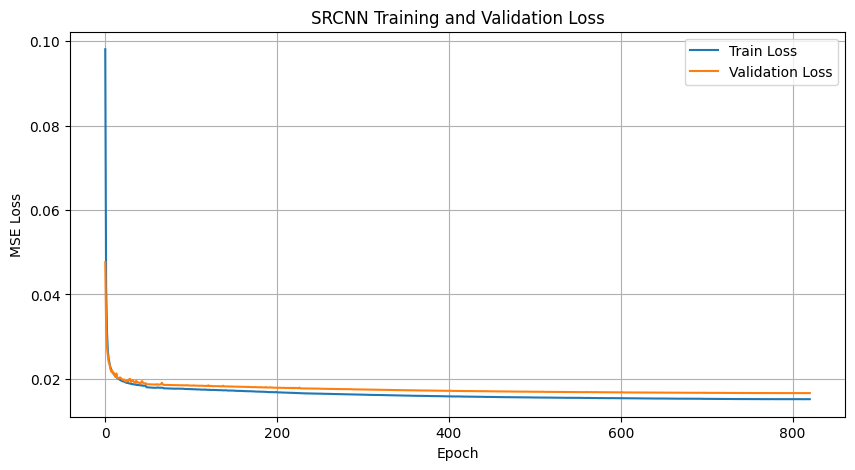

In [5]:
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('SRCNN Training and Validation Loss')
plt.legend()
plt.grid()
plt.show()

In [6]:
model = MODEL_CLASS(upsample_factor=factor)
weights, _ = load_results(model_name, factor)
model.load_state_dict(weights)
model.to(device)

FSRCA(
  (extract): Sequential(
    (0): Conv2d(1, 56, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): PReLU(num_parameters=56)
  )
  (shrink): Sequential(
    (0): Conv2d(56, 12, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=12)
  )
  (mapping): RIR(
    (blocks): Sequential(
      (0): RCAB(
        (body): Sequential(
          (0): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU(inplace=True)
          (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): CALayer(
            (avg_pool): AdaptiveAvgPool2d(output_size=1)
            (channel_att): Sequential(
              (0): Conv2d(12, 1, kernel_size=(1, 1), stride=(1, 1))
              (1): ReLU(inplace=True)
              (2): Conv2d(1, 12, kernel_size=(1, 1), stride=(1, 1))
              (3): Sigmoid()
            )
          )
        )
      )
      (1): RCAB(
        (body): Sequential(
          (0): Conv2d(12, 12, kernel_s

In [7]:
evaluate_model_on_sets(model, sets=[5, 14], factor_list=[2], device=device, show_plots=False)

Set 5, Factor 2 - Average PSNR: 34.61 dB, SSIM: 0.9268
Set 14, Factor 2 - Average PSNR: 30.64 dB, SSIM: 0.8683


### Fine Tuning

In [8]:
ft_model = MODEL_CLASS(upsample_factor=factor)
weights, _ = load_results(model_name, factor)
ft_model.load_state_dict(weights)

train_loader, val_loader = get_dataloaders(factor, n_workers_train=0, n_workers_val=0, dataset="General100")

In [9]:
ft_train_loss, ft_val_loss, ft_psnr_list = train_model(ft_model, train_loader, val_loader, factor, num_epochs=ft_epochs, lr=ft_lr, criterion=criterion)
save_results(ft_model, ft_train_loss, ft_val_loss, ft_psnr_list, model_name, factor, ft=True)

Epoch 1/1000 - Training: 100%|██████████| 86/86 [00:50<00:00,  1.70it/s]


[Epoch 1] Train Loss: 0.024246
[Epoch 1] Validation Loss: 0.018090, PSNR: 33.44


Epoch 2/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 2] Train Loss: 0.015157
[Epoch 2] Validation Loss: 0.018413, PSNR: 33.26
No improvement for 1 epochs.


Epoch 3/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 3] Train Loss: 0.015155
[Epoch 3] Validation Loss: 0.018362, PSNR: 33.31
No improvement for 2 epochs.


Epoch 4/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 4] Train Loss: 0.015063
[Epoch 4] Validation Loss: 0.018153, PSNR: 33.40
No improvement for 3 epochs.


Epoch 5/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 5] Train Loss: 0.014986
[Epoch 5] Validation Loss: 0.018656, PSNR: 33.18
No improvement for 4 epochs.


Epoch 6/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 6] Train Loss: 0.014891
[Epoch 6] Validation Loss: 0.018128, PSNR: 33.40
No improvement for 5 epochs.


Epoch 7/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 7] Train Loss: 0.014864
[Epoch 7] Validation Loss: 0.017708, PSNR: 33.65


Epoch 8/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 8] Train Loss: 0.014777
[Epoch 8] Validation Loss: 0.017796, PSNR: 33.58
No improvement for 1 epochs.


Epoch 9/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 9] Train Loss: 0.014743
[Epoch 9] Validation Loss: 0.017682, PSNR: 33.65


Epoch 10/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 10] Train Loss: 0.014688
[Epoch 10] Validation Loss: 0.017869, PSNR: 33.54
No improvement for 1 epochs.


Epoch 11/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 11] Train Loss: 0.014638
[Epoch 11] Validation Loss: 0.017656, PSNR: 33.67


Epoch 12/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 12] Train Loss: 0.014581
[Epoch 12] Validation Loss: 0.017482, PSNR: 33.73


Epoch 13/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 13] Train Loss: 0.014519
[Epoch 13] Validation Loss: 0.017793, PSNR: 33.61
No improvement for 1 epochs.


Epoch 14/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 14] Train Loss: 0.013887
[Epoch 14] Validation Loss: 0.017025, PSNR: 33.96


Epoch 15/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 15] Train Loss: 0.013828
[Epoch 15] Validation Loss: 0.017101, PSNR: 33.92
No improvement for 1 epochs.


Epoch 16/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 16] Train Loss: 0.013829
[Epoch 16] Validation Loss: 0.016993, PSNR: 34.00


Epoch 17/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 17] Train Loss: 0.013832
[Epoch 17] Validation Loss: 0.017051, PSNR: 33.96
No improvement for 1 epochs.


Epoch 18/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 18] Train Loss: 0.013836
[Epoch 18] Validation Loss: 0.016971, PSNR: 34.01


Epoch 19/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 19] Train Loss: 0.013847
[Epoch 19] Validation Loss: 0.016977, PSNR: 34.01
No improvement for 1 epochs.


Epoch 20/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 20] Train Loss: 0.013849
[Epoch 20] Validation Loss: 0.016918, PSNR: 34.05


Epoch 21/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 21] Train Loss: 0.013868
[Epoch 21] Validation Loss: 0.017092, PSNR: 33.96
No improvement for 1 epochs.


Epoch 22/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 22] Train Loss: 0.013863
[Epoch 22] Validation Loss: 0.017286, PSNR: 33.81
No improvement for 2 epochs.


Epoch 23/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 23] Train Loss: 0.013882
[Epoch 23] Validation Loss: 0.017093, PSNR: 33.96
No improvement for 3 epochs.


Epoch 24/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 24] Train Loss: 0.013867
[Epoch 24] Validation Loss: 0.017002, PSNR: 33.99
No improvement for 4 epochs.


Epoch 25/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 25] Train Loss: 0.013881
[Epoch 25] Validation Loss: 0.017076, PSNR: 33.96
No improvement for 5 epochs.


Epoch 26/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 26] Train Loss: 0.013835
[Epoch 26] Validation Loss: 0.017235, PSNR: 33.86
No improvement for 6 epochs.


Epoch 27/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 27] Train Loss: 0.013397
[Epoch 27] Validation Loss: 0.016683, PSNR: 34.21


Epoch 28/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 28] Train Loss: 0.013311
[Epoch 28] Validation Loss: 0.016674, PSNR: 34.21


Epoch 29/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 29] Train Loss: 0.013307
[Epoch 29] Validation Loss: 0.016671, PSNR: 34.21


Epoch 30/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 30] Train Loss: 0.013308
[Epoch 30] Validation Loss: 0.016693, PSNR: 34.19
No improvement for 1 epochs.


Epoch 31/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 31] Train Loss: 0.013323
[Epoch 31] Validation Loss: 0.016667, PSNR: 34.21


Epoch 32/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 32] Train Loss: 0.013303
[Epoch 32] Validation Loss: 0.016660, PSNR: 34.22


Epoch 33/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 33] Train Loss: 0.013295
[Epoch 33] Validation Loss: 0.016660, PSNR: 34.22
No improvement for 1 epochs.


Epoch 34/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 34] Train Loss: 0.013300
[Epoch 34] Validation Loss: 0.016673, PSNR: 34.21
No improvement for 2 epochs.


Epoch 35/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 35] Train Loss: 0.013314
[Epoch 35] Validation Loss: 0.016680, PSNR: 34.20
No improvement for 3 epochs.


Epoch 36/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 36] Train Loss: 0.013316
[Epoch 36] Validation Loss: 0.016667, PSNR: 34.21
No improvement for 4 epochs.


Epoch 37/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 37] Train Loss: 0.013325
[Epoch 37] Validation Loss: 0.016669, PSNR: 34.21
No improvement for 5 epochs.


Epoch 38/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 38] Train Loss: 0.013351
[Epoch 38] Validation Loss: 0.016713, PSNR: 34.18
No improvement for 6 epochs.


Epoch 39/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 39] Train Loss: 0.013284
[Epoch 39] Validation Loss: 0.016644, PSNR: 34.23


Epoch 40/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 40] Train Loss: 0.013276
[Epoch 40] Validation Loss: 0.016642, PSNR: 34.23


Epoch 41/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 41] Train Loss: 0.013275
[Epoch 41] Validation Loss: 0.016642, PSNR: 34.23


Epoch 42/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 42] Train Loss: 0.013273
[Epoch 42] Validation Loss: 0.016641, PSNR: 34.23


Epoch 43/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 43] Train Loss: 0.013272
[Epoch 43] Validation Loss: 0.016640, PSNR: 34.23


Epoch 44/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 44] Train Loss: 0.013271
[Epoch 44] Validation Loss: 0.016637, PSNR: 34.23


Epoch 45/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 45] Train Loss: 0.013271
[Epoch 45] Validation Loss: 0.016635, PSNR: 34.23


Epoch 46/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 46] Train Loss: 0.013269
[Epoch 46] Validation Loss: 0.016635, PSNR: 34.23
No improvement for 1 epochs.


Epoch 47/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 47] Train Loss: 0.013269
[Epoch 47] Validation Loss: 0.016637, PSNR: 34.23
No improvement for 2 epochs.


Epoch 48/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 48] Train Loss: 0.013279
[Epoch 48] Validation Loss: 0.016662, PSNR: 34.21
No improvement for 3 epochs.


Epoch 49/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 49] Train Loss: 0.013281
[Epoch 49] Validation Loss: 0.016642, PSNR: 34.23
No improvement for 4 epochs.


Epoch 50/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 50] Train Loss: 0.013271
[Epoch 50] Validation Loss: 0.016644, PSNR: 34.23
No improvement for 5 epochs.


Epoch 51/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 51] Train Loss: 0.013272
[Epoch 51] Validation Loss: 0.016632, PSNR: 34.23


Epoch 52/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 52] Train Loss: 0.013273
[Epoch 52] Validation Loss: 0.016625, PSNR: 34.24


Epoch 53/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 53] Train Loss: 0.013287
[Epoch 53] Validation Loss: 0.016628, PSNR: 34.24
No improvement for 1 epochs.


Epoch 54/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 54] Train Loss: 0.013289
[Epoch 54] Validation Loss: 0.016625, PSNR: 34.24


Epoch 55/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 55] Train Loss: 0.013282
[Epoch 55] Validation Loss: 0.016648, PSNR: 34.22
No improvement for 1 epochs.


Epoch 56/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 56] Train Loss: 0.013292
[Epoch 56] Validation Loss: 0.016622, PSNR: 34.24


Epoch 57/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 57] Train Loss: 0.013277
[Epoch 57] Validation Loss: 0.016659, PSNR: 34.22
No improvement for 1 epochs.


Epoch 58/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 58] Train Loss: 0.013289
[Epoch 58] Validation Loss: 0.016649, PSNR: 34.22
No improvement for 2 epochs.


Epoch 59/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 59] Train Loss: 0.013275
[Epoch 59] Validation Loss: 0.016646, PSNR: 34.22
No improvement for 3 epochs.


Epoch 60/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 60] Train Loss: 0.013292
[Epoch 60] Validation Loss: 0.016664, PSNR: 34.21
No improvement for 4 epochs.


Epoch 61/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.10it/s]


[Epoch 61] Train Loss: 0.013307
[Epoch 61] Validation Loss: 0.016645, PSNR: 34.22
No improvement for 5 epochs.


Epoch 62/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 62] Train Loss: 0.013291
[Epoch 62] Validation Loss: 0.016745, PSNR: 34.17
No improvement for 6 epochs.


Epoch 63/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.94it/s]


[Epoch 63] Train Loss: 0.013255
[Epoch 63] Validation Loss: 0.016613, PSNR: 34.25


Epoch 64/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.94it/s]


[Epoch 64] Train Loss: 0.013244
[Epoch 64] Validation Loss: 0.016612, PSNR: 34.25


Epoch 65/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.06it/s]


[Epoch 65] Train Loss: 0.013241
[Epoch 65] Validation Loss: 0.016611, PSNR: 34.25


Epoch 66/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.09it/s]


[Epoch 66] Train Loss: 0.013241
[Epoch 66] Validation Loss: 0.016611, PSNR: 34.25
No improvement for 1 epochs.


Epoch 67/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 67] Train Loss: 0.013241
[Epoch 67] Validation Loss: 0.016609, PSNR: 34.25


Epoch 68/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 68] Train Loss: 0.013239
[Epoch 68] Validation Loss: 0.016609, PSNR: 34.25
No improvement for 1 epochs.


Epoch 69/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 69] Train Loss: 0.013239
[Epoch 69] Validation Loss: 0.016609, PSNR: 34.25
No improvement for 2 epochs.


Epoch 70/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 70] Train Loss: 0.013239
[Epoch 70] Validation Loss: 0.016609, PSNR: 34.25
No improvement for 3 epochs.


Epoch 71/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 71] Train Loss: 0.013239
[Epoch 71] Validation Loss: 0.016607, PSNR: 34.25


Epoch 72/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 72] Train Loss: 0.013242
[Epoch 72] Validation Loss: 0.016610, PSNR: 34.25
No improvement for 1 epochs.


Epoch 73/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.07it/s]


[Epoch 73] Train Loss: 0.013239
[Epoch 73] Validation Loss: 0.016607, PSNR: 34.25


Epoch 74/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.05it/s]


[Epoch 74] Train Loss: 0.013235
[Epoch 74] Validation Loss: 0.016607, PSNR: 34.25


Epoch 75/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 75] Train Loss: 0.013235
[Epoch 75] Validation Loss: 0.016604, PSNR: 34.25


Epoch 76/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 76] Train Loss: 0.013236
[Epoch 76] Validation Loss: 0.016604, PSNR: 34.25


Epoch 77/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 77] Train Loss: 0.013239
[Epoch 77] Validation Loss: 0.016610, PSNR: 34.25
No improvement for 1 epochs.


Epoch 78/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 78] Train Loss: 0.013253
[Epoch 78] Validation Loss: 0.016609, PSNR: 34.25
No improvement for 2 epochs.


Epoch 79/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.12it/s]


[Epoch 79] Train Loss: 0.013237
[Epoch 79] Validation Loss: 0.016607, PSNR: 34.25
No improvement for 3 epochs.


Epoch 80/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 80] Train Loss: 0.013241
[Epoch 80] Validation Loss: 0.016611, PSNR: 34.25
No improvement for 4 epochs.


Epoch 81/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 81] Train Loss: 0.013241
[Epoch 81] Validation Loss: 0.016601, PSNR: 34.25


Epoch 82/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 82] Train Loss: 0.013234
[Epoch 82] Validation Loss: 0.016599, PSNR: 34.25


Epoch 83/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.10it/s]


[Epoch 83] Train Loss: 0.013247
[Epoch 83] Validation Loss: 0.016632, PSNR: 34.23
No improvement for 1 epochs.


Epoch 84/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 84] Train Loss: 0.013251
[Epoch 84] Validation Loss: 0.016638, PSNR: 34.23
No improvement for 2 epochs.


Epoch 85/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 85] Train Loss: 0.013235
[Epoch 85] Validation Loss: 0.016597, PSNR: 34.25


Epoch 86/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 86] Train Loss: 0.013231
[Epoch 86] Validation Loss: 0.016603, PSNR: 34.25
No improvement for 1 epochs.


Epoch 87/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 87] Train Loss: 0.013258
[Epoch 87] Validation Loss: 0.016619, PSNR: 34.24
No improvement for 2 epochs.


Epoch 88/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 88] Train Loss: 0.013235
[Epoch 88] Validation Loss: 0.016602, PSNR: 34.25
No improvement for 3 epochs.


Epoch 89/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 89] Train Loss: 0.013222
[Epoch 89] Validation Loss: 0.016591, PSNR: 34.26


Epoch 90/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.12it/s]


[Epoch 90] Train Loss: 0.013220
[Epoch 90] Validation Loss: 0.016591, PSNR: 34.26


Epoch 91/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 91] Train Loss: 0.013219
[Epoch 91] Validation Loss: 0.016591, PSNR: 34.26
No improvement for 1 epochs.


Epoch 92/1000 - Training: 100%|██████████| 86/86 [00:51<00:00,  1.68it/s]


[Epoch 92] Train Loss: 0.013218
[Epoch 92] Validation Loss: 0.016590, PSNR: 34.26


Epoch 93/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.93it/s]


[Epoch 93] Train Loss: 0.013219
[Epoch 93] Validation Loss: 0.016590, PSNR: 34.26


Epoch 94/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 94] Train Loss: 0.013218
[Epoch 94] Validation Loss: 0.016589, PSNR: 34.26


Epoch 95/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.07it/s]


[Epoch 95] Train Loss: 0.013218
[Epoch 95] Validation Loss: 0.016590, PSNR: 34.26
No improvement for 1 epochs.


Epoch 96/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.12it/s]


[Epoch 96] Train Loss: 0.013218
[Epoch 96] Validation Loss: 0.016589, PSNR: 34.26


Epoch 97/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.12it/s]


[Epoch 97] Train Loss: 0.013217
[Epoch 97] Validation Loss: 0.016588, PSNR: 34.26


Epoch 98/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.02it/s]


[Epoch 98] Train Loss: 0.013216
[Epoch 98] Validation Loss: 0.016593, PSNR: 34.26
No improvement for 1 epochs.


Epoch 99/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.10it/s]


[Epoch 99] Train Loss: 0.013217
[Epoch 99] Validation Loss: 0.016592, PSNR: 34.26
No improvement for 2 epochs.


Epoch 100/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 100] Train Loss: 0.013216
[Epoch 100] Validation Loss: 0.016590, PSNR: 34.26
No improvement for 3 epochs.


Epoch 101/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 101] Train Loss: 0.013214
[Epoch 101] Validation Loss: 0.016588, PSNR: 34.26


Epoch 102/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.06it/s]


[Epoch 102] Train Loss: 0.013213
[Epoch 102] Validation Loss: 0.016586, PSNR: 34.26


Epoch 103/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.05it/s]


[Epoch 103] Train Loss: 0.013213
[Epoch 103] Validation Loss: 0.016587, PSNR: 34.26
No improvement for 1 epochs.


Epoch 104/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.96it/s]


[Epoch 104] Train Loss: 0.013214
[Epoch 104] Validation Loss: 0.016586, PSNR: 34.26


Epoch 105/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.02it/s]


[Epoch 105] Train Loss: 0.013214
[Epoch 105] Validation Loss: 0.016584, PSNR: 34.26


Epoch 106/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.07it/s]


[Epoch 106] Train Loss: 0.013212
[Epoch 106] Validation Loss: 0.016586, PSNR: 34.26
No improvement for 1 epochs.


Epoch 107/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.05it/s]


[Epoch 107] Train Loss: 0.013213
[Epoch 107] Validation Loss: 0.016584, PSNR: 34.26


Epoch 108/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.07it/s]


[Epoch 108] Train Loss: 0.013212
[Epoch 108] Validation Loss: 0.016584, PSNR: 34.26
No improvement for 1 epochs.


Epoch 109/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.12it/s]


[Epoch 109] Train Loss: 0.013213
[Epoch 109] Validation Loss: 0.016585, PSNR: 34.26
No improvement for 2 epochs.


Epoch 110/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 110] Train Loss: 0.013212
[Epoch 110] Validation Loss: 0.016584, PSNR: 34.26


Epoch 111/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 111] Train Loss: 0.013211
[Epoch 111] Validation Loss: 0.016584, PSNR: 34.26


Epoch 112/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.10it/s]


[Epoch 112] Train Loss: 0.013211
[Epoch 112] Validation Loss: 0.016584, PSNR: 34.26
No improvement for 1 epochs.


Epoch 113/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.09it/s]


[Epoch 113] Train Loss: 0.013211
[Epoch 113] Validation Loss: 0.016584, PSNR: 34.26


Epoch 114/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.05it/s]


[Epoch 114] Train Loss: 0.013211
[Epoch 114] Validation Loss: 0.016584, PSNR: 34.26


Epoch 115/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 115] Train Loss: 0.013210
[Epoch 115] Validation Loss: 0.016582, PSNR: 34.26


Epoch 116/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 116] Train Loss: 0.013210
[Epoch 116] Validation Loss: 0.016583, PSNR: 34.26
No improvement for 1 epochs.


Epoch 117/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 117] Train Loss: 0.013210
[Epoch 117] Validation Loss: 0.016583, PSNR: 34.26
No improvement for 2 epochs.


Epoch 118/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.09it/s]


[Epoch 118] Train Loss: 0.013210
[Epoch 118] Validation Loss: 0.016582, PSNR: 34.26
No improvement for 3 epochs.


Epoch 119/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.01it/s]


[Epoch 119] Train Loss: 0.013210
[Epoch 119] Validation Loss: 0.016583, PSNR: 34.26
No improvement for 4 epochs.


Epoch 120/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.94it/s]


[Epoch 120] Train Loss: 0.013209
[Epoch 120] Validation Loss: 0.016583, PSNR: 34.26
No improvement for 5 epochs.


Epoch 121/1000 - Training: 100%|██████████| 86/86 [00:29<00:00,  2.87it/s]


[Epoch 121] Train Loss: 0.013209
[Epoch 121] Validation Loss: 0.016583, PSNR: 34.26
No improvement for 6 epochs.


Epoch 122/1000 - Training: 100%|██████████| 86/86 [00:30<00:00,  2.85it/s]


[Epoch 122] Train Loss: 0.013210
[Epoch 122] Validation Loss: 0.016582, PSNR: 34.26


Epoch 123/1000 - Training: 100%|██████████| 86/86 [00:28<00:00,  3.07it/s]


[Epoch 123] Train Loss: 0.013208
[Epoch 123] Validation Loss: 0.016582, PSNR: 34.26
No improvement for 1 epochs.


Epoch 124/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 124] Train Loss: 0.013209
[Epoch 124] Validation Loss: 0.016581, PSNR: 34.26


Epoch 125/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 125] Train Loss: 0.013208
[Epoch 125] Validation Loss: 0.016581, PSNR: 34.26


Epoch 126/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 126] Train Loss: 0.013208
[Epoch 126] Validation Loss: 0.016581, PSNR: 34.26


Epoch 127/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 127] Train Loss: 0.013209
[Epoch 127] Validation Loss: 0.016581, PSNR: 34.26


Epoch 128/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 128] Train Loss: 0.013208
[Epoch 128] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 1 epochs.


Epoch 129/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 129] Train Loss: 0.013208
[Epoch 129] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 2 epochs.


Epoch 130/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 130] Train Loss: 0.013208
[Epoch 130] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 3 epochs.


Epoch 131/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 131] Train Loss: 0.013208
[Epoch 131] Validation Loss: 0.016580, PSNR: 34.26


Epoch 132/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 132] Train Loss: 0.013208
[Epoch 132] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 1 epochs.


Epoch 133/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 133] Train Loss: 0.013208
[Epoch 133] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 2 epochs.


Epoch 134/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 134] Train Loss: 0.013208
[Epoch 134] Validation Loss: 0.016580, PSNR: 34.26


Epoch 135/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 135] Train Loss: 0.013208
[Epoch 135] Validation Loss: 0.016580, PSNR: 34.26


Epoch 136/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 136] Train Loss: 0.013208
[Epoch 136] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 1 epochs.


Epoch 137/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 137] Train Loss: 0.013209
[Epoch 137] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 2 epochs.


Epoch 138/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.09it/s]


[Epoch 138] Train Loss: 0.013208
[Epoch 138] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 3 epochs.


Epoch 139/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 139] Train Loss: 0.013207
[Epoch 139] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 4 epochs.


Epoch 140/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 140] Train Loss: 0.013208
[Epoch 140] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 5 epochs.


Epoch 141/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 141] Train Loss: 0.013209
[Epoch 141] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 6 epochs.


Epoch 142/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 142] Train Loss: 0.013208
[Epoch 142] Validation Loss: 0.016580, PSNR: 34.26


Epoch 143/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 143] Train Loss: 0.013208
[Epoch 143] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 1 epochs.


Epoch 144/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 144] Train Loss: 0.013208
[Epoch 144] Validation Loss: 0.016580, PSNR: 34.26


Epoch 145/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 145] Train Loss: 0.013208
[Epoch 145] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 1 epochs.


Epoch 146/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 146] Train Loss: 0.013208
[Epoch 146] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 2 epochs.


Epoch 147/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 147] Train Loss: 0.013208
[Epoch 147] Validation Loss: 0.016581, PSNR: 34.26
No improvement for 3 epochs.


Epoch 148/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 148] Train Loss: 0.013208
[Epoch 148] Validation Loss: 0.016580, PSNR: 34.26


Epoch 149/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 149] Train Loss: 0.013207
[Epoch 149] Validation Loss: 0.016580, PSNR: 34.26


Epoch 150/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 150] Train Loss: 0.013207
[Epoch 150] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 1 epochs.


Epoch 151/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 151] Train Loss: 0.013207
[Epoch 151] Validation Loss: 0.016579, PSNR: 34.26


Epoch 152/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 152] Train Loss: 0.013207
[Epoch 152] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 1 epochs.


Epoch 153/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 153] Train Loss: 0.013207
[Epoch 153] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 2 epochs.


Epoch 154/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 154] Train Loss: 0.013207
[Epoch 154] Validation Loss: 0.016579, PSNR: 34.26


Epoch 155/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 155] Train Loss: 0.013207
[Epoch 155] Validation Loss: 0.016579, PSNR: 34.26
No improvement for 1 epochs.


Epoch 156/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 156] Train Loss: 0.013207
[Epoch 156] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 2 epochs.


Epoch 157/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 157] Train Loss: 0.013207
[Epoch 157] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 3 epochs.


Epoch 158/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 158] Train Loss: 0.013207
[Epoch 158] Validation Loss: 0.016579, PSNR: 34.26
No improvement for 4 epochs.


Epoch 159/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 159] Train Loss: 0.013207
[Epoch 159] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 5 epochs.


Epoch 160/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 160] Train Loss: 0.013207
[Epoch 160] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 6 epochs.


Epoch 161/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.14it/s]


[Epoch 161] Train Loss: 0.013207
[Epoch 161] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 7 epochs.


Epoch 162/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 162] Train Loss: 0.013208
[Epoch 162] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 8 epochs.


Epoch 163/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 163] Train Loss: 0.013206
[Epoch 163] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 9 epochs.


Epoch 164/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.13it/s]


[Epoch 164] Train Loss: 0.013207
[Epoch 164] Validation Loss: 0.016580, PSNR: 34.26
No improvement for 10 epochs.
Early stopping triggered at epoch 164


In [10]:
ft_model = MODEL_CLASS(upsample_factor=factor)
ft_weights, _ = load_results(model_name, factor, ft=True)
ft_model.load_state_dict(ft_weights)
ft_model.to(device)

FSRCA(
  (extract): Sequential(
    (0): Conv2d(1, 56, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): PReLU(num_parameters=56)
  )
  (shrink): Sequential(
    (0): Conv2d(56, 12, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=12)
  )
  (mapping): RIR(
    (blocks): Sequential(
      (0): RCAB(
        (body): Sequential(
          (0): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): ReLU(inplace=True)
          (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): CALayer(
            (avg_pool): AdaptiveAvgPool2d(output_size=1)
            (channel_att): Sequential(
              (0): Conv2d(12, 1, kernel_size=(1, 1), stride=(1, 1))
              (1): ReLU(inplace=True)
              (2): Conv2d(1, 12, kernel_size=(1, 1), stride=(1, 1))
              (3): Sigmoid()
            )
          )
        )
      )
      (1): RCAB(
        (body): Sequential(
          (0): Conv2d(12, 12, kernel_s

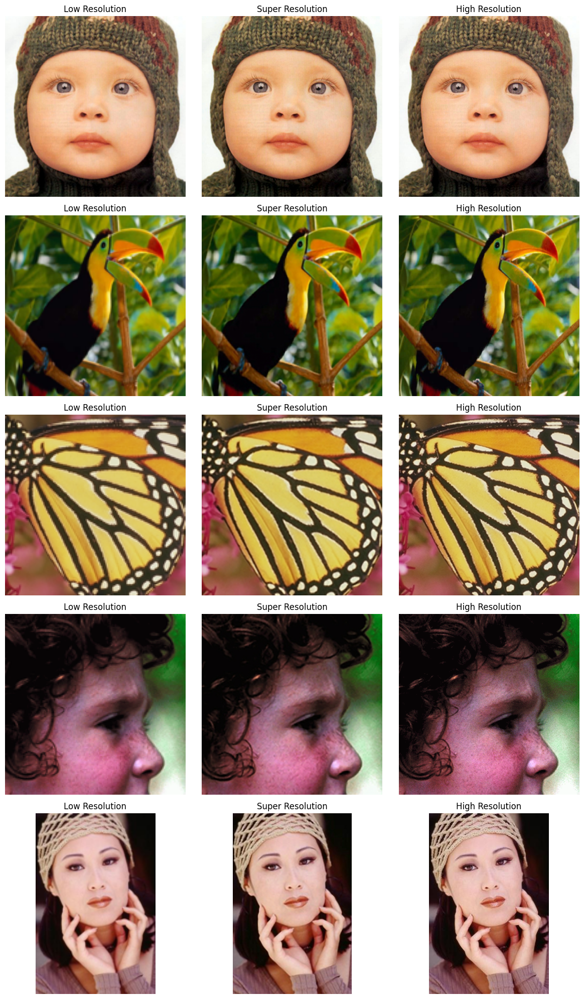

Set 5, Factor 2 - Average PSNR: 34.64 dB, SSIM: 0.9272


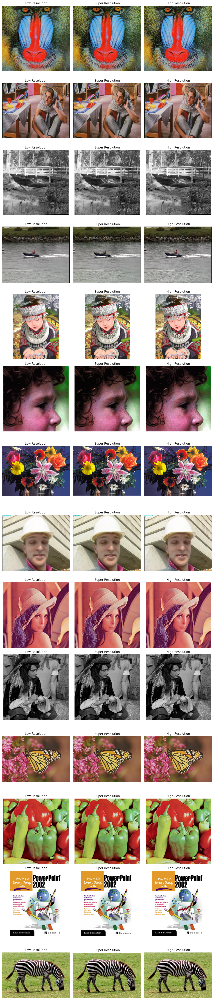

Set 14, Factor 2 - Average PSNR: 30.64 dB, SSIM: 0.8686


In [12]:
evaluate_model_on_sets(ft_model, sets=[5, 14], factor_list=[2], device=device, show_plots=True)